In [ ]:
# ================================
# Namesti potrebne knjižnice
# ================================
!pip install pytorch-forecasting
!pip install --quiet pytorch-optimizer scikit-learn lightning optuna optuna-integration[pytorch_lightning] tensorboard

# ================================
# Sistem in Drive
# ================================
from google.colab import drive
import os
from datetime import datetime, timedelta
import time
import math
import warnings

# Montiraj Google Drive
drive.mount("/content/drive", force_remount=True)

# Mape za shranjevanje
base_path = '/content/drive/My Drive/Magisterij_Bucar'
save_dir_slike = os.path.join(base_path, "Slike")
save_dir_podatki = os.path.join(base_path, "Podatki")
save_dir_modeli = os.path.join(base_path, "Modeli")
save_dir_lightning = os.path.join(base_path, "lightning_logs")
os.makedirs(save_dir_slike, exist_ok=True)
os.makedirs(save_dir_modeli, exist_ok=True)
os.makedirs(save_dir_podatki, exist_ok=True)
os.makedirs(save_dir_lightning, exist_ok=True)

# ================================
# Osnovne knjižnice
# ================================
import numpy as np
import pandas as pd
import requests
import holidays
import joblib
from itertools import accumulate

# ================================
# Vizualizacija
# ================================
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
from matplotlib.gridspec import GridSpec
from matplotlib.ticker import ScalarFormatter
from scipy.stats import gaussian_kde
import matplotlib.ticker as mticker

# ================================
# Scikit-learn
# ================================
from sklearn.preprocessing import MinMaxScaler, StandardScaler, RobustScaler, PowerTransformer
from sklearn.feature_selection import mutual_info_regression, SequentialFeatureSelector
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# ================================
# PyTorch
# ================================
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
from torch.optim.lr_scheduler import ReduceLROnPlateau
from torch.optim import AdamW
torch.backends.cudnn.benchmark = True
torch.backends.cudnn.deterministic = False
torch.set_float32_matmul_precision("high")
device = "cuda" if torch.cuda.is_available() else "cpu"

# ================================
# PyTorch Lightning
# ================================
import lightning as L
from lightning.pytorch import Trainer, seed_everything
from lightning.pytorch.callbacks import EarlyStopping, ModelCheckpoint, LearningRateMonitor, StochasticWeightAveraging
from lightning.pytorch.loggers import TensorBoardLogger
from lightning.pytorch.tuner import Tuner

# ================================
# Optuna
# ================================
import optuna
import optuna.visualization as vis
from optuna.integration import PyTorchLightningPruningCallback

# ================================
# PyTorch Forecasting
# ================================
from pytorch_forecasting import (
    TimeSeriesDataSet, NaNLabelEncoder, TemporalFusionTransformer, BaseModel,
    GroupNormalizer, EncoderNormalizer
)
from pytorch_forecasting.metrics import MAE, RMSE, QuantileLoss, SMAPE, MASE, MAPE
from pytorch_forecasting.models import RecurrentNetwork
from pytorch_forecasting.data import TorchNormalizer

# =============================
# Statistična orodja (time series)
# =============================
from statsmodels.tsa.filters.hp_filter import hpfilter
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

# ================================
# Ostalo
# ================================
from pandas.api.types import CategoricalDtype
from tensorboard.backend.event_processing.event_accumulator import EventAccumulator
from pytorch_optimizer import Ranger

# ================================
# Opozorila
# ================================
warnings.filterwarnings("ignore", message=".*does not have valid feature names.*")
warnings.filterwarnings("ignore")

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 197.7/197.7 kB 15.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 819.0/819.0 kB 48.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 2.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 101.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 82.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 47.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 4.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 40.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 17.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 4.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 111.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

### Funkcije

In [ ]:
def plot_close_with_variable(df, variable, ax_main=None, ax_close=None, ax_dist=None):
    series = df[variable]
    close = df["Close"]
    nan_pct = series.isna().mean() * 100
    corr = df[[variable, "Close"]].corr().iloc[0, 1]

    if ax_main is None or ax_close is None or ax_dist is None:
        fig = plt.figure(figsize=(8, 4.5))
        gs = GridSpec(1, 2, width_ratios=[1.2, 4], wspace=0.12)
        ax_dist = fig.add_subplot(gs[0])
        ax_main = fig.add_subplot(gs[1])
        ax_close = ax_main.twinx()
        show_plot = True
    else:
        show_plot = False

    # Histogram + KDE
    sns.histplot(series.dropna(), ax=ax_dist, color="gray", edgecolor="black", bins=20, alpha=0.8)
    x_vals = np.linspace(series.min(), series.max(), 200)
    kde = gaussian_kde(series.dropna())
    ax_dist.plot(x_vals, kde(x_vals) * len(series) * (series.max() - series.min()) / 20,
                 color="black", linewidth=1.0)
    ax_dist.set_title(f"Distribucija: {variable}", fontsize=12)
    ax_dist.set_ylabel("Frekvenca", fontsize=12)
    ax_dist.set_xlabel("")
    ax_dist.tick_params(axis='both', labelsize=10)
    ax_dist.grid(False)
    ax_dist.xaxis.offsetText.set_visible(False)
    ax_dist.yaxis.offsetText.set_visible(False)
    ax_dist.xaxis.set_major_formatter(ScalarFormatter())
    ax_dist.yaxis.set_major_formatter(ScalarFormatter())

    # BTC Close – desna os
    sns.lineplot(x=close.index, y=close, ax=ax_close, color="#f7931a", linewidth=2.2, alpha=0.3)
    ax_close.set_ylabel("BTC Close", fontsize=12, color="#f7931a")
    ax_close.tick_params(axis='y', labelsize=10, labelcolor="#f7931a")
    ax_close.yaxis.offsetText.set_visible(False)
    ax_close.yaxis.set_major_formatter(ScalarFormatter())
    ax_close.grid(False)

    # Originalna serija – leva os
    sns.lineplot(x=series.index, y=series, ax=ax_main, color="grey", linewidth=1.0, label="Original")

    ax_main.set_ylabel(variable, fontsize=12, color="black")
    ax_main.tick_params(axis='y', labelsize=10, labelcolor='black')
    ax_main.tick_params(axis='x', labelsize=10)
    ax_main.yaxis.offsetText.set_visible(False)
    ax_main.yaxis.set_major_formatter(ScalarFormatter())

    ax_main.text(0.02, 0.95, f"Korelacija: {corr:.2f}\nManjkajoče: {nan_pct:.1f}%",
                 transform=ax_main.transAxes, fontsize=10, verticalalignment='top',
                 bbox=dict(boxstyle="round,pad=0.4", facecolor="white",
                           edgecolor="black", linewidth=0.8, alpha=1), zorder=30)

    ax_main.set_title(f"BTC Close vs. {variable}", fontsize=12)
    ax_main.grid(False)
    ax_main.xaxis.label.set_visible(False)
    ax_main.xaxis.offsetText.set_visible(False)

    # Legenda spodaj
    handles, labels = ax_main.get_legend_handles_labels()
    close_handle = plt.Line2D([], [], color="#f7931a", linewidth=2.2, alpha=0.3, label="BTC Close")
    handles.append(close_handle)
    labels.append("BTC Close")
    ax_main.get_legend().remove()
    if show_plot:
        plt.subplots_adjust(left=0.05, right=0.96, top=0.88, bottom=0.2, wspace=0.25)
        plt.show()

def plot_variables_grid(df, variables, ncols=2, img_name=""):
    import math
    import matplotlib.pyplot as plt
    from matplotlib.gridspec import GridSpec

    n = len(variables)
    nrows = math.ceil(n / ncols)
    fig = plt.figure(figsize=(22, 5 * nrows), constrained_layout=True)
    outer_gs = GridSpec(nrows, ncols, figure=fig, hspace=0.25)

    for i, var in enumerate(variables):
        row, col = divmod(i, ncols)
        inner_gs = outer_gs[row, col].subgridspec(1, 2, width_ratios=[1.3, 4], wspace=0.05)

        ax_dist = fig.add_subplot(inner_gs[0])
        ax_main = fig.add_subplot(inner_gs[1])
        ax_close = ax_main.twinx()

        plot_close_with_variable(
            df=df,
            variable=var,
            ax_main=ax_main,
            ax_close=ax_close,
            ax_dist=ax_dist
        )

    plt.savefig(os.path.join(save_dir_slike, (img_name + ".png")), dpi=300)
    plt.show()

In [ ]:
def plot_training_metrics(model_name, save_dir_lightning, save_dir_slike):

    log_dir = os.path.join(save_dir_lightning, model_name.split("_")[0], model_name)
    event_path = [os.path.join(log_dir, f) for f in os.listdir(log_dir) if "events.out.tfevents" in f][0]

    event_acc = EventAccumulator(event_path)
    event_acc.Reload()
    tags = event_acc.Tags()["scalars"]

    metrics = {}
    for tag in tags:
        events = event_acc.Scalars(tag)
        df = pd.DataFrame({"step": [e.step for e in events], tag: [e.value for e in events]})
        metrics[tag] = df

    df_metrics = metrics.pop(tags[0])
    for tag in tags[1:]:
        df_metrics = pd.merge(df_metrics, metrics[tag], on="step", how="outer")

    df_metrics = df_metrics.sort_values("step").reset_index(drop=True)

    metrics_cols = [col for col in df_metrics.columns if col != "step"]
    n_metrics = len(metrics_cols)
    ncols = 3
    nrows = math.ceil(n_metrics / ncols)

    fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=(4 * ncols, 3.5 * nrows))
    axs = axs.flatten()

    def thousands(x, pos):
        return f'{x / 1000:.1f}k'

    for i, col in enumerate(metrics_cols):
        sns.lineplot(
            data=df_metrics, x="step", y=col, ax=axs[i],
            linewidth=2.2, linestyle='-', color=f"C{i % 10}"
        )
        axs[i].set_title(col, fontsize=9, fontweight="bold")
        axs[i].set_xlabel("Korak (step)", fontsize=7)
        axs[i].set_ylabel("Vrednost", fontsize=7)
        axs[i].xaxis.set_major_locator(mticker.MaxNLocator(integer=True))
        axs[i].xaxis.set_major_formatter(mticker.FuncFormatter(thousands))
        axs[i].grid(False)

    for j in range(i + 1, len(axs)):
        axs[j].axis("off")

    plt.tight_layout()
    plt.savefig(os.path.join(save_dir_slike, f"{model_name.lower()}_learning_metrics.png"), dpi=300)
    plt.show()

    return df_metrics

In [ ]:
def prepare_dataloaders(
    max_prediction_length=7,
    max_encoder_length=64,
    batch_size=16,
    target_lags=3,
    val_df_size=0.35,
    target_center=True,
    target_transformation="log",
    time_varying_unknown_reals=None
):

    df_main = pd.read_feather(os.path.join(save_dir_podatki, "daily_data_model_orig.feather")).copy()
    max_time_idx = df_main["time_idx"].max()

    test_size = (max_encoder_length + max_prediction_length + 1 + target_lags)
    val_size = int((max_time_idx - test_size) * val_df_size)

    cutoff_val = max_time_idx - test_size
    cutoff_train = cutoff_val - val_size - max_encoder_length - max_prediction_length - target_lags - 1

    df_train = df_main[df_main["time_idx"] <= cutoff_train].copy()
    df_val = df_main[(df_main["time_idx"] > cutoff_train) & (df_main["time_idx"] <= cutoff_val)].copy()
    df_test = df_main[df_main["time_idx"] > cutoff_val].copy()

    print(f"Train size: {len(df_train)}")
    print(f"Validation size: {len(df_val)}")
    print(f"Test size: {len(df_test)}")


    time_varying_known_reals = [
          "GDP and National Income", "Personal Income and Employment", "Industry Specific Accounts",
          "Fixed Assets and Investment", "Trade and International Transactions",
          "Government and Public Sector", "Financial and Corporate Data",
          "time_idx", 'year'
      ]

    time_varying_known_categoricals = [
        'US', 'UK', 'Japan', 'China', 'day', 'month', 'day_of_week', 'week_of_year',
        'year', 'quarter', 'is_weekend', 'is_month_end', 'Halving', 'group'
    ]

    if time_varying_unknown_reals is None:
      time_varying_unknown_reals = ["Close"]
    else:
      time_varying_unknown_reals = time_varying_unknown_reals

    categorical_encoders = {col: NaNLabelEncoder(add_nan=True) for col in time_varying_known_categoricals}

    seed_everything(42, workers=True)

    training = TimeSeriesDataSet(
        df_train,
        time_idx="time_idx",
        target="Close",
        group_ids=["group"],
        max_encoder_length=max_encoder_length,
        max_prediction_length=max_prediction_length,
        static_categoricals=["group"],
        time_varying_known_categoricals=time_varying_known_categoricals,
        time_varying_known_reals=time_varying_known_reals,
        time_varying_unknown_reals=time_varying_unknown_reals,
        target_normalizer=EncoderNormalizer(transformation=target_transformation, center=target_center),
        add_relative_time_idx=True,
        add_target_scales=True,
        add_encoder_length=True,
        allow_missing_timesteps=True,
        categorical_encoders=categorical_encoders,
        lags={"Close": list(np.arange(1, target_lags))}
    )

    validation = TimeSeriesDataSet.from_dataset(training, df_val, predict=False, stop_randomization=True)
    test = TimeSeriesDataSet.from_dataset(training, df_test, predict=False, stop_randomization=True)
    preds = TimeSeriesDataSet.from_dataset(training, df_test, predict=True, stop_randomization=True)

    num_workers = 2
    train_dataloader = training.to_dataloader(train=True, batch_size=batch_size, num_workers=num_workers)
    val_dataloader = validation.to_dataloader(train=False, batch_size=batch_size, num_workers=num_workers)
    test_dataloader = test.to_dataloader(train=False, batch_size=batch_size, num_workers=num_workers)
    predict_dataloader = preds.to_dataloader(train=False, batch_size=batch_size, num_workers=num_workers)

    return training, train_dataloader, val_dataloader, test_dataloader, predict_dataloader


# **Branje in priprava podatkov**

In [ ]:
# Branje in nastavitev indeksa
df = pd.read_csv(os.path.join(save_dir_podatki, "daily_data.csv"), parse_dates=["Date"])
df = df.set_index("Date").sort_index()

df["group"] = "BTC"

df = df[[
    "GDP and National Income", "Personal Income and Employment", "Industry Specific Accounts",
    "Fixed Assets and Investment", "Trade and International Transactions",
    "Government and Public Sector", "Financial and Corporate Data",
    "time_idx", "year", "Close",
    "US", "UK", "Japan", "China",
    "day", "month", "day_of_week", "week_of_year", "quarter",
    "is_weekend", "is_month_end", "Halving", "group"
]]

cat_cols = [
    "US", "UK", "Japan", "China", "day", "month", "day_of_week", "week_of_year",
    "year", "quarter", "is_weekend", "is_month_end", "Halving", "group"
]
df[cat_cols] = df[cat_cols].astype("category")

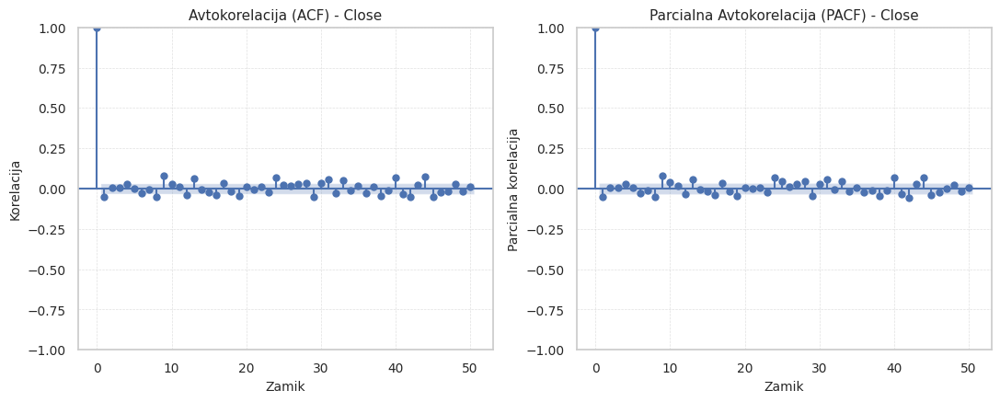

In [ ]:
sns.set(style="whitegrid", context="notebook", font_scale=0.9)

fig, axes = plt.subplots(1, 2, figsize=(11, 4.5))

# ACF
plot_acf(df["Close"].dropna().diff(1).dropna(), lags=50, ax=axes[0], zero=True)
axes[0].set_title("Avtokorelacija (ACF) - Close", fontsize=11)
axes[0].set_xlabel("Zamik", fontsize=10)
axes[0].set_ylabel("Korelacija", fontsize=10)
axes[0].grid(True, linestyle="--", linewidth=0.5, alpha=0.6)

# PACF
plot_pacf(df["Close"].dropna().diff(1).dropna(), lags=50, ax=axes[1], zero=True, method="ywm")
axes[1].set_title("Parcialna Avtokorelacija (PACF) - Close", fontsize=11)
axes[1].set_xlabel("Zamik", fontsize=10)
axes[1].set_ylabel("Parcialna korelacija", fontsize=10)
axes[1].grid(True, linestyle="--", linewidth=0.5, alpha=0.6)

plt.tight_layout()
plt.savefig(os.path.join(save_dir_slike, "Avtokorelacija.png"), dpi=300)
plt.show()

In [ ]:
first_valid = df["Close"].first_valid_index()
last_valid = "1.1.2025"
df = df.loc[first_valid:last_valid]
df.tail()

,Close,High,Low,Open,Volume,BTC_miners,BTC_transactions,BTC_network,Unique Addresses Used,Number of Transactions,...,month,day_of_week,week_of_year,year,quarter,is_weekend,is_month_end,time_idx,Halving,group
Date,,,,,,,,,,,,,,,,,,,,,
2024-12-28,95163.929688,95525.898438,94014.289062,94160.187500,2.410744e+10,0.854107,0.188373,2.598846,NaN,298580.0,...,12,5,52,2024,4,1,0,3755,0,BTC
2024-12-29,93530.226562,95174.875000,92881.789062,95174.054688,2.963589e+10,0.707849,0.201526,2.613978,NaN,NaN,...,12,6,52,2024,4,1,0,3756,0,BTC
2024-12-30,92643.210938,94903.320312,91317.132812,93527.195312,5.618800e+10,0.604987,0.218638,2.629167,NaN,NaN,...,12,0,1,2024,4,0,0,3757,0,BTC
2024-12-31,93429.203125,96090.601562,91914.031250,92643.250000,4.362511e+10,0.502125,0.221753,2.640448,545227.0,NaN,...,12,1,1,2024,4,0,1,3758,0,BTC
2025-01-01,94419.757812,94929.867188,92788.125000,93425.101562,2.451989e+10,0.492856,0.273510,2.651729,NaN,292213.0,...,1,2,1,2025,1,0,0,3759,0,BTC


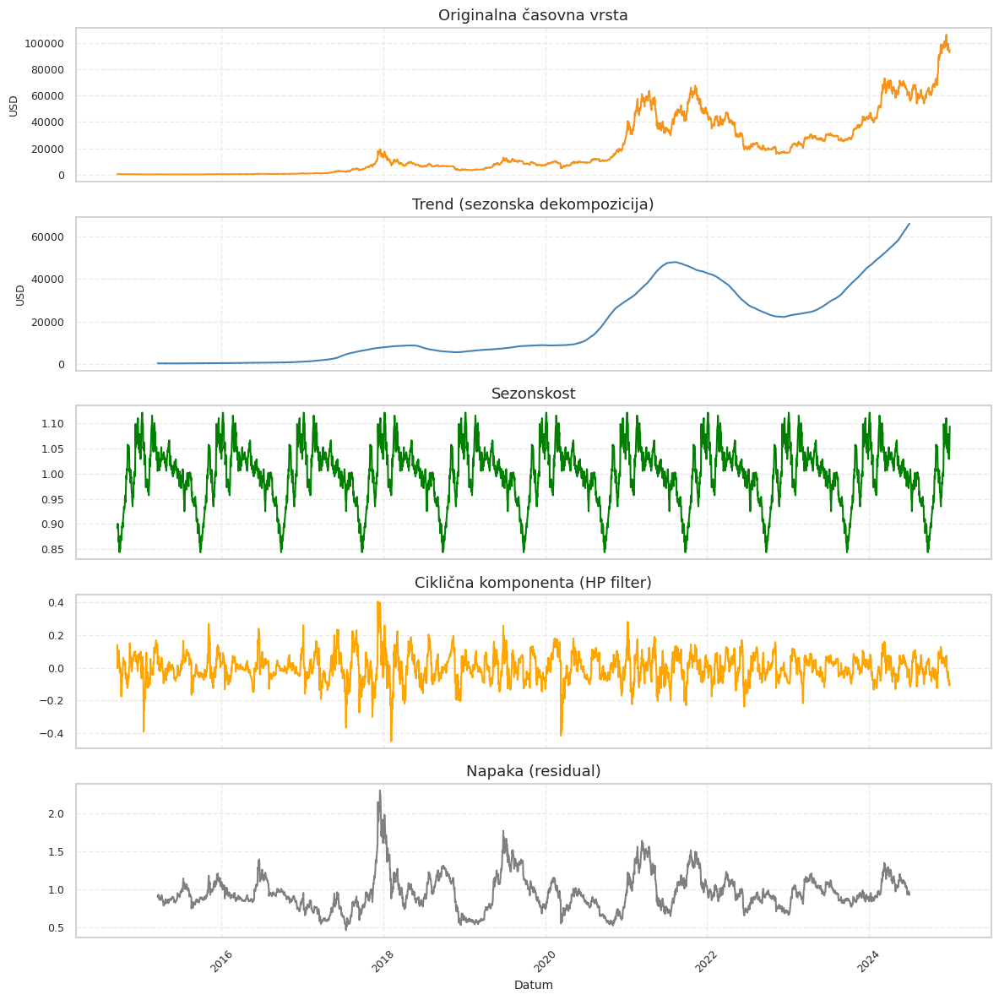

In [ ]:
sns.set(style="whitegrid", context="notebook", font_scale=1.0)
btc_color = "#f7931a"
close = df[['Close']].dropna()

# Dekompozicija
result = seasonal_decompose(close['Close'], model='multiplicative', period=365)
cycle, trend = hpfilter(np.log(close['Close']), lamb=(129000))

# Plot
fig, axes = plt.subplots(5, 1, figsize=(12, 12), sharex=True)

titles = [
    "Originalna časovna vrsta",
    "Trend (sezonska dekompozicija)",
    "Sezonskost",
    "Ciklična komponenta (HP filter)",
    "Napaka (residual)"
]
colors = [btc_color, "steelblue", "green", "orange", "gray"]
series = [close["Close"], result.trend, result.seasonal, cycle, result.resid]

for i, ax in enumerate(axes):
    sns.lineplot(ax=ax, x=close.index, y=series[i], color=colors[i])
    ax.set_title(titles[i], fontsize=13)
    ax.set_ylabel("USD" if i == 0 or i == 1 else "", fontsize=9)
    ax.tick_params(labelsize=9)
    ax.grid(True, linestyle="--", alpha=0.4)

axes[-1].set_xlabel("Datum", fontsize=10)
plt.xticks(rotation=45)
plt.tight_layout()
plt.savefig(os.path.join(save_dir_slike, "Decomposition.png"), dpi=300)
plt.show()


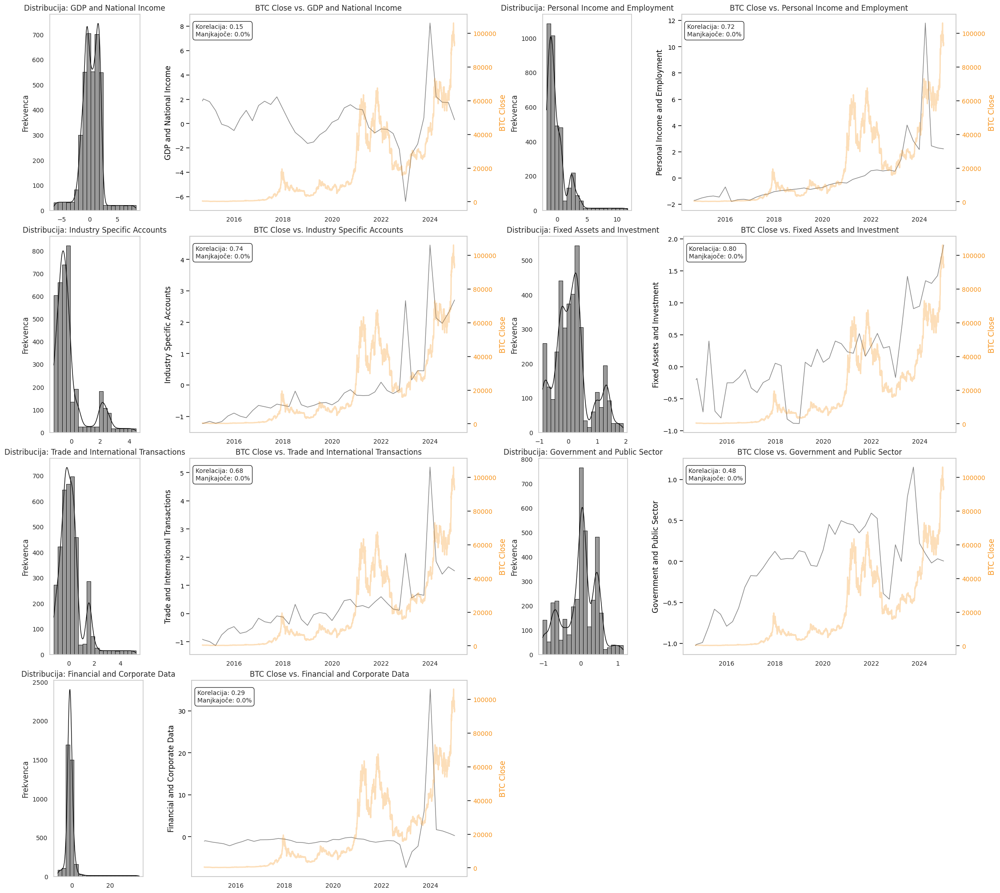

In [ ]:
cols_economy_indicators = [
"GDP and National Income",
"Personal Income and Employment",
"Industry Specific Accounts",
"Fixed Assets and Investment",
"Trade and International Transactions",
"Government and Public Sector",
"Financial and Corporate Data"
]

plot_variables_grid(df, cols_economy_indicators, ncols=2, img_name="indicators_BEA")

In [ ]:
# === Definicija stolpcev ===
cat_ord_cols = ['day', 'month', 'day_of_week', 'week_of_year', 'year', 'quarter']
binary_cols = ['is_weekend', 'is_month_end', 'Halving']
all_cat_cols = cat_ord_cols + binary_cols

# === Definicija urejenih kategorij ===
ordered_categories = {
    'day': list(range(1, 32)),
    'month': list(range(1, 13)),
    'day_of_week': list(range(0, 7)),
    'week_of_year': list(range(1, 54)),
    'year': sorted(df['year'].dropna().unique().astype(int)),
    'quarter': [1, 2, 3, 4],
    'is_weekend': [0, 1],
    'is_month_end': [0, 1],
    'Halving': [0, 1]
}

# === Pretvorba v urejene kategorije (kot string) ===
for col in all_cat_cols:
    categories = [str(x) for x in ordered_categories[col]]  # vrednosti kot string
    cat_type = CategoricalDtype(categories=categories, ordered=True)
    df[col] = df[col].astype(str).astype(cat_type)
df["time_idx"] = np.arange(0, len(df["time_idx"])).astype(int)

In [ ]:
numeric_cols = df.select_dtypes(include=["number"]).columns
df[numeric_cols] = df[numeric_cols].interpolate(method="time", limit_direction="both")
df

,Close,High,Low,Open,Volume,BTC_miners,BTC_transactions,BTC_network,Unique Addresses Used,Number of Transactions,...,month,day_of_week,week_of_year,year,quarter,is_weekend,is_month_end,time_idx,Halving,group
Date,,,,,,,,,,,,,,,,,,,,,
2014-09-17,457.334015,468.174011,452.421997,465.864014,2.105680e+07,-1.281754,-0.744510,-1.029606,143062.00,63482.00,...,9,2,38,2014,3,0,0,0,0,BTC
2014-09-18,424.440002,456.859985,413.104004,456.859985,3.448320e+07,-1.280837,-0.656293,-1.025174,143062.00,63482.00,...,9,3,38,2014,3,0,0,1,0,BTC
2014-09-19,394.795990,427.834991,384.532013,424.102997,3.791970e+07,-1.279926,-0.467710,-1.016296,143062.00,63482.00,...,9,4,38,2014,3,0,0,2,0,BTC
2014-09-20,408.903992,423.295990,389.882996,394.673004,3.686360e+07,-1.279014,-0.183130,-1.039239,148220.50,63482.00,...,9,5,38,2014,3,1,0,3,0,BTC
2014-09-21,398.821014,412.425995,393.181000,408.084991,2.658010e+07,-1.280326,-0.232635,-1.045409,153379.00,66355.00,...,9,6,38,2014,3,1,0,4,0,BTC
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-12-28,95163.929688,95525.898438,94014.289062,94160.187500,2.410744e+10,0.854107,0.188373,2.598846,562675.75,298580.00,...,12,5,52,2024,4,1,0,3755,0,BTC
2024-12-29,93530.226562,95174.875000,92881.789062,95174.054688,2.963589e+10,0.707849,0.201526,2.613978,556859.50,296988.25,...,12,6,52,2024,4,1,0,3756,0,BTC
2024-12-30,92643.210938,94903.320312,91317.132812,93527.195312,5.618800e+10,0.604987,0.218638,2.629167,551043.25,295396.50,...,12,0,1,2024,4,0,0,3757,0,BTC


In [ ]:
df.to_feather(os.path.join(save_dir_podatki, "daily_data_model_orig.feather"))

In [ ]:
training, train_dataloader, val_dataloader, test_dataloader, predict_dataloader = prepare_dataloaders(
    max_prediction_length=7,
    max_encoder_length=64,
    batch_size=16,
    target_lags=3,
    val_df_size=0.35,
    target_center=True,
    target_transformation="log")

lr_patience=3
early_stop_min_delta=5
early_stop_patience=8


INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42


Train size: 2321
Validation size: 1364
Test size: 75


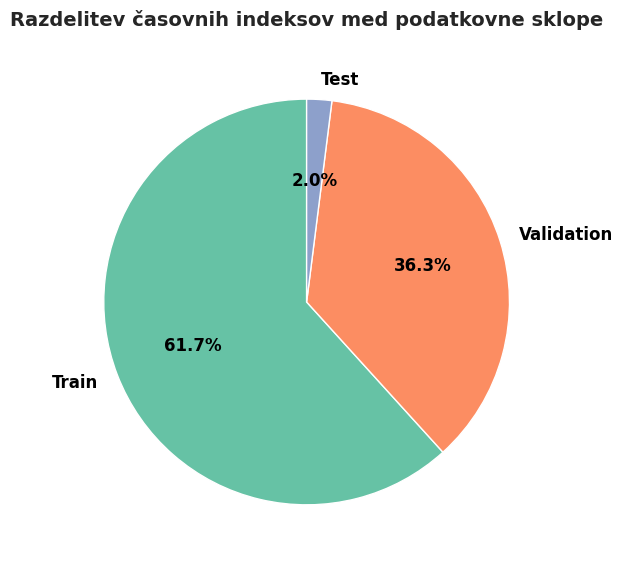

In [ ]:

sns.set_style("whitegrid")
sns.set_palette("pastel")

# Podatki
sizes = [2321, 1364, 75]
labels = ['Train', 'Validation', 'Test']
colors = sns.color_palette("Set2", n_colors=3)

# Pie chart
fig, ax = plt.subplots(figsize=(6, 6))
wedges, texts, autotexts = ax.pie(
    sizes,
    labels=labels,
    autopct='%1.1f%%',
    startangle=90,
    colors=colors,
    wedgeprops=dict(edgecolor='white'),
    textprops=dict(color="black", fontsize=12, fontweight='bold')
)

# Krožni diagram z legendami

ax.set_title("Razdelitev časovnih indeksov med podatkovne sklope", fontsize=14, fontweight='bold')
ax.axis('equal')

plt.tight_layout()
plt.show()

# **LSTM** - *Long-Short Term Memory*  

In [ ]:
class MyRecurrentLSTM(RecurrentNetwork):
    def __init__(self, beta1=0.9, beta2=0.95, alpha=0.5, k=6, lr_factor=0.65, lr_patience=3, min_lr=1e-9, **kwargs):
        self.save_hyperparameters(ignore=["loss", "logging_metrics"])
        super().__init__(**kwargs)
        self.training_time = None

    def configure_optimizers(self):
        optimizer = Ranger(
            self.parameters(),
            lr=self.hparams.learning_rate,
            betas=(self.hparams.beta1, self.hparams.beta2),
            weight_decay=self.hparams.weight_decay,
             eps=1e-8,
            k=self.hparams.k,
            alpha=self.hparams.alpha
        )
        scheduler = {
            "scheduler": ReduceLROnPlateau(
                optimizer,
                mode="min",
                factor=self.hparams.lr_factor,
                patience=self.hparams.lr_patience,
                min_lr=self.hparams.min_lr,
                verbose=True
            ),
            "monitor": "val_loss",
            "interval": "epoch",
            "frequency": 1
        }
        return {"optimizer": optimizer, "lr_scheduler": scheduler}

In [ ]:
def train_RNN(
    training,
    train_dataloader,
    val_dataloader,
    test_dataloader,
    predict_dataloader,
    version="4",
    model="LSTM",
    hidden_size=64,
    rnn_layers=3,
    dropout=0.1,
    learning_rate=1e-4,
    output_size=1,
    gradient_clip_val=1,
    weight_decay=1e-10,
    beta1=0.91,
    beta2=0.98,
    alpha=0.5,
    k=6,
    lr_factor=0.75,
    lr_patience=3,
    min_lr=1e-9,
    early_stop_min_delta=1e-4,
    early_stop_patience=10,
    plot=True,
    trial=None,
    max_epoch=500,
    find_lr=False,
):
    model_tag = model.strip().upper()
    model_name = f"{model}_v{version}"
    model_dir = str(model)

    seed_everything(42, workers=True)

    model = MyRecurrentLSTM.from_dataset(
        training,
        cell_type=model,
        hidden_size=hidden_size,
        rnn_layers=rnn_layers,
        dropout=dropout,
        loss=RMSE(),
        learning_rate=learning_rate,
        output_size=output_size,
        weight_decay=weight_decay,
        beta1=beta1,
        beta2=beta2,
        alpha=alpha,
        k=k,
        lr_factor=lr_factor,
        lr_patience=lr_patience,
        min_lr=min_lr,
        logging_metrics=nn.ModuleList([SMAPE(), MAE(), RMSE(), MAPE(), MASE()]),
    )

    callbacks = [
        EarlyStopping(monitor="val_loss", patience=early_stop_patience, min_delta=early_stop_min_delta, verbose=plot),
        LearningRateMonitor(logging_interval="step"),
        ModelCheckpoint(
            monitor="val_loss",
            dirpath=os.path.join(save_dir_lightning, model_dir, model_name),
            filename="best-checkpoint",
            save_top_k=1,
            mode="min"
        )
    ]

    if trial is not None:
        callbacks.append(PyTorchLightningPruningCallback(trial, monitor="val_loss"))

    logger = TensorBoardLogger(save_dir=save_dir_lightning, name=model_dir, version=model_name)

    trainer = Trainer(
        max_epochs=max_epoch,
        gradient_clip_val=gradient_clip_val,
        callbacks=callbacks,
        accelerator="gpu",
        devices=1,
        enable_progress_bar=True,
        log_every_n_steps=5,
        logger=logger,
        enable_model_summary=plot,
    )

    if find_lr:
        tuner = Tuner(trainer)
        lr_finder = tuner.lr_find(
            model=model,
            min_lr=1e-4,
            max_lr=1e-3,
            num_training=100,
            train_dataloaders=train_dataloader,
            val_dataloaders=val_dataloader,
        )
        print(f"Predlagan LR: {lr_finder.suggestion()}")
        lr_finder.plot(suggest=True).show()
        return None, None

    start_time = time.time()
    trainer.fit(model, train_dataloader, val_dataloader)
    elapsed_time = time.time() - start_time
    model.training_time = elapsed_time
    if trial is not None:
        model.val_loss = callbacks[0].best_score.item()
        return model

    model = MyRecurrentLSTM.load_from_checkpoint(trainer.checkpoint_callback.best_model_path)


    trainer.test(model, test_dataloader)

    raw_output = model.predict(predict_dataloader, mode="prediction", return_x=True, batch_size=1000)
    x, preds = raw_output.x, raw_output.output

    df_plot = pd.DataFrame({
        "time_idx": np.concatenate([x["decoder_time_idx"][i].cpu().numpy() for i in range(len(preds))]),
        "y_pred": np.concatenate([preds[i].cpu().numpy() for i in range(len(preds))]),
        "y_true": np.concatenate([x["decoder_target"][i].cpu().numpy() for i in range(len(preds))]),
    })

    # Metrike
    mae = mean_absolute_error(df_plot["y_true"], df_plot["y_pred"])
    rmse = np.sqrt(mean_squared_error(df_plot["y_true"], df_plot["y_pred"]))
    mase = mae / np.mean(np.abs(df_plot["y_true"].diff().dropna()))
    mape = np.mean(np.abs((df_plot["y_true"] - df_plot["y_pred"]) / df_plot["y_true"])) * 100
    smape = np.mean(np.abs(df_plot["y_pred"] - df_plot["y_true"]) / ((np.abs(df_plot["y_true"]) + np.abs(df_plot["y_pred"])) / 2)) * 100
    n = len(df_plot)
    rss = np.sum((df_plot["y_true"] - df_plot["y_pred"]) ** 2)
    k_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
    aic = n * np.log(rss / n) + 2 * k_params
    bic = n * np.log(rss / n) + k_params * np.log(n)

    model.mae, model.rmse, model.mase = mae, rmse, mase
    model.mape, model.smape, model.aic, model.bic = mape, smape, aic, bic

    if plot:

        # == Shranimo model ===
        model_save_path = os.path.join(save_dir_modeli, f"{model_name.lower()}.ckpt")
        trainer.save_checkpoint(model_save_path)
        print(f"Model shranjen na: {model_save_path}")

        # == Plot train metrics ===
        plot_training_metrics(model_name, save_dir_lightning, save_dir_slike)


        fig, axs = plt.subplots(1, 2, figsize=(15, 5))

        # === Leva slika: Full forecast ===
        sns.lineplot(data=df_plot, x="time_idx", y="y_true", label="Dejanske cene", linewidth=2.2, color="black", ax=axs[0])
        sns.lineplot(data=df_plot, x="time_idx", y="y_pred", label="Napovedane cene", linewidth=2.2, color="firebrick", ax=axs[0])
        axs[0].set_xlabel("Časovni indeks")
        axs[0].set_ylabel("BTC cena (USD)")
        axs[0].set_title(f"Celotna napoved\nModel: {model_tag}", fontsize=13, fontweight="bold")
        axs[0].legend(loc="best", frameon=True)
        axs[0].grid(True, linestyle="--", alpha=0.4)

        # === Desna slika: Sample window forecast ===
        idx = 0
        time_dec = x["decoder_time_idx"][idx].detach().cpu().numpy()
        y_true_sample = x["decoder_target"][idx].detach().cpu().numpy()
        y_pred_sample = preds[idx].detach().cpu().numpy()
        enc_len = x["encoder_cont"][idx].shape[0]
        y_enc = x["encoder_target"][idx][:enc_len].detach().cpu().numpy()
        time_enc = time_dec[0] - np.arange(enc_len, 0, -1)

        sns.lineplot(x=time_enc, y=y_enc, label="Pretekle vrednosti", linewidth=2.2, linestyle='--', color="steelblue", ax=axs[1])
        sns.lineplot(x=time_dec, y=y_true_sample, label="Resnično", linewidth=2.2, linestyle='-', color="royalblue", ax=axs[1])
        sns.lineplot(x=time_dec, y=y_pred_sample, label="Napoved", linewidth=2.2, linestyle='-', color="tomato", ax=axs[1])
        axs[1].set_xlabel("Časovni indeks")
        axs[1].set_ylabel("Cena (Close)")
        axs[1].set_title(f"Napoved vzorca (sample window)\nModel: {model_tag}", fontsize=13, fontweight="bold")
        axs[1].legend(loc="best", frameon=True)
        axs[1].grid(True, linestyle="--", alpha=0.4)

        # Shranjevanje in prikaz
        plt.tight_layout()
        plt.savefig(os.path.join(save_dir_slike, f"{model_name.lower()}_forecast_both.png"), dpi=300)
        plt.show()

    print("###############################")
    print(f"MAE:   {mae:.2f}")
    print(f"RMSE:  {rmse:.2f}")
    print(f"MASE:  {mase:.2f}")
    print(f"MAPE:  {mape:.2f}")
    print(f"SMAPE: {smape:.2f}")
    print(f"AIC:   {aic:.2f}")
    print(f"BIC:   {bic:.2f}")
    print(f"Training time: {elapsed_time:.2f} sec ({elapsed_time / 60:.2f} min)")
    print("###############################")

    return model

#### Eksperimentalni paramteri

In [ ]:
params = {'batch_size': 32, 'hidden_size': 128, 'rnn_layers': 3, 'dropout': 0.1467041914369223, 'learning_rate': 2.6892010819637984e-05, 'gradient_clip_val': 0.4204185600332674, 'weight_decay': 1.173123806806249e-09, 'beta1': 0.9216005806447212, 'beta2': 0.927878058639595, 'alpha': 0.7195146627658218, 'k': 9, 'lr_factor': 0.5176870136588252, 'max_encoder_length': 95}

params = {'batch_size': 16, 'hidden_size': 64, 'rnn_layers': 2, 'dropout': 0.4158331727950799, 'learning_rate': 0.0018574283672054077, 'gradient_clip_val': 0.8837289598723236, 'weight_decay': 9.079959193818916e-09, 'beta1': 0.8540919866455376, 'beta2': 0.9076444793625109, 'alpha': 0.6218622063179607, 'k': 9, 'lr_factor': 0.3783040144700798, 'max_encoder_length': 55}

params = {'batch_size': 16,'hidden_size': 64, 'rnn_layers': 1, 'dropout': 0.319198308913078, 'learning_rate': 0.0026445216348007857, 'gradient_clip_val': 0.8697994089952285, 'weight_decay': 5.390095936538422e-10, 'beta1': 0.8400537717677823, 'beta2': 0.9122666722934248, 'alpha': 0.6762868211285962, 'k': 10, 'lr_factor': 0.3419476805282393, 'max_encoder_length': 58}

params = {'batch_size': 16,'hidden_size': 104, 'rnn_layers': 4, 'dropout': 0.28612482734842033, 'learning_rate': 0.0030959953521856472, 'gradient_clip_val': 0.13884370336637925, 'weight_decay': 8.358589097635207e-07, 'beta1': 0.9124977225198229, 'beta2': 0.9322449000721501, 'alpha': 0.4282272166359192, 'k': 6, 'lr_factor': 0.7387057236622966, 'max_encoder_length': 40}

params = {'batch_size': 16, 'hidden_size': 88, 'rnn_layers': 1, 'dropout': 0.15233544753692227, 'learning_rate': 0.004573970286205505, 'gradient_clip_val': 0.36366930851362117, 'weight_decay': 3.1567432180254405e-07, 'beta1': 0.9363320958697556, 'beta2': 0.9174757833450841, 'alpha': 0.6412006549694858, 'k': 8, 'lr_factor': 0.3457367071490032, 'max_encoder_length': 90}

params = {'batch_size': 16, 'rnn_layers': 1, 'hidden_size': 68, 'dropout': 0.3408513777964699, 'learning_rate': 0.0015651281553969627, 'gradient_clip_val': 0.744292967336111, 'weight_decay': 5.602987233471763e-08, 'beta1': 0.9038371351615602, 'beta2': 0.9663676473434836, 'alpha': 0.7194959050391624, 'k': 9, 'lr_factor': 0.3551932708058716, 'max_encoder_length': 40}

params = {'batch_size': 16, 'rnn_layers': 1, 'hidden_size': 68, 'dropout': 0.3408513777964699, 'learning_rate': 0.003099472005614043, 'gradient_clip_val': 0.744292967336111, 'weight_decay': 5.602987233471763e-08, 'beta1': 0.9038371351615602, 'beta2': 0.9663676473434836, 'alpha': 0.7194959050391624, 'k': 9, 'lr_factor': 0.3551932708058716, 'max_encoder_length': 40}

params = {'batch_size': 32, 'hidden_size': 4, 'rnn_layers': 2, 'dropout': 0.4716282054532145, 'learning_rate': 0.00019262752535133363, 'gradient_clip_val': 0.045543464680200166, 'weight_decay': 2.7879086526375403e-07, 'beta1': 0.8512949498734038, 'beta2': 0.9981858759100232, 'alpha': 0.49529663143962377, 'k': 6, 'lr_factor': 0.35226919406860685, 'max_encoder_length': 40}

params = {'hidden_size': 128, 'rnn_layers': 3, 'dropout': 0.49848491424263686, 'learning_rate': 0.00011247794948405517, 'gradient_clip_val': 0.11593188204505249, 'weight_decay': 6.584570887920547e-05, 'beta1': 0.8919699484682919, 'beta2': 0.9004868100542307, 'alpha': 0.5665545167121762, 'k': 9, 'lr_factor': 0.3828355619355143, 'max_encoder_length': 70}

params = {'hidden_size': 32, 'rnn_layers': 2, 'dropout': 0.3935759218556827, 'gradient_clip_val': 0.19504405648163725, 'weight_decay': 1.6898494508406327e-05, 'beta1': 0.9145063592301323, 'beta2': 0.9754238144544246, 'alpha': 0.636361172431157, 'k': 7, 'lr_factor': 0.3272425576227949, 'max_encoder_length': 53}

params = {'hidden_size': 16, 'rnn_layers': 3, 'dropout': 0.40533238152101886, 'learning_rate': 0.002935159967911608, 'gradient_clip_val': 0.21611547470972875, 'weight_decay': 1.5069350781177668e-07, 'beta1': 0.9193624624135369, 'beta2': 0.9708410244727896, 'alpha': 0.6242370850563197, 'k': 8, 'lr_factor': 0.536752115634225, 'max_encoder_length': 55}

params = {'hidden_size': 32, 'rnn_layers': 2, 'dropout': 0.65533238152101886, 'learning_rate': 0.002935159967911608, 'gradient_clip_val': 0.21611547470972875, 'weight_decay': 5.5069350781177668e-02, 'beta1': 0.9193624624135369, 'beta2': 0.9708410244727896, 'alpha': 0.6242370850563197, 'k': 8, 'lr_factor': 0.536752115634225, 'max_encoder_length': 100}

params = {'hidden_size': 48, 'rnn_layers': 1, 'dropout': 0.2919595775701467, 'learning_rate': 0.002327838909851737, 'gradient_clip_val': 0.4245683281330002, 'weight_decay': 1.2340153308218343e-07, 'beta1': 0.8801003558586441, 'beta2': 0.9590164783720603, 'alpha': 0.6495898626746129, 'k': 8, 'lr_factor': 0.48145453145709216}

params = {'hidden_size': 64, 'rnn_layers': 2, 'dropout': 0.3864025446442899, 'learning_rate': 0.0019174763602643051, 'gradient_clip_val': 0.242779303504729, 'weight_decay': 8.788099171181617e-08, 'beta1': 0.9126932251626766, 'beta2': 0.9851370392805773, 'alpha': 0.6746193836745432, 'k': 8, 'lr_factor': 0.5617750400642294}

params = {'hidden_size': 22, 'rnn_layers': 2, 'dropout': 0.4481595042561845, 'learning_rate': 0.0015332294641262404, 'gradient_clip_val': 0.1777975191343217, 'weight_decay': 7.869416078495835e-08, 'beta1': 0.8822402677146216, 'beta2': 0.9764541345171789, 'alpha': 0.6845661838422569, 'k': 6, 'lr_factor': 0.3383592055230813}

params ={'hidden_size': 64, 'rnn_layers': 2, 'dropout': 0.3864025446442899, 'learning_rate': 0.0019174763602643051, 'gradient_clip_val': 0.242779303504729, 'weight_decay': 8.788099171181617e-08, 'beta1': 0.9126932251626766, 'beta2': 0.9851370392805773, 'alpha': 0.6746193836745432, 'k': 8, 'lr_factor': 0.5617750400642294}

params = {'hidden_size': 75, 'rnn_layers': 2, 'dropout': 0.2754359141766313, 'learning_rate': 0.0006398324628352656, 'gradient_clip_val': 0.7966052460567761, 'weight_decay': 3.025007493241807e-07, 'beta1': 0.9040971449560052, 'beta2': 0.9831121338412976, 'alpha': 0.6813800949296518, 'k': 8, 'lr_factor': 0.585453600433211}

params ={'hidden_size': 64, 'rnn_layers': 2, 'dropout': 0.3864025446442899, 'learning_rate': 0.0019174763602643051, 'gradient_clip_val': 0.242779303504729, 'weight_decay': 8.788099171181617e-03, 'beta1': 0.9126932251626766, 'beta2': 0.9851370392805773, 'alpha': 0.6746193836745432, 'k': 8, 'lr_factor': 0.5617750400642294}

params ={'hidden_size': 96, 'rnn_layers': 3, 'dropout': 0.4678590151956009, 'learning_rate': 0.0017056418361311833, 'gradient_clip_val': 0.18698309305825334, 'weight_decay': 5.690778533278694e-03, 'beta1': 0.8704544744089695, 'beta2': 0.9649923196212503, 'alpha': 0.521375640051578, 'k': 6, 'lr_factor': 0.38952722415074564}

params = {'hidden_size': 80, 'rnn_layers': 2, 'dropout': 0.5020551850688604, 'learning_rate': 0.0007666566490248205, 'gradient_clip_val': 0.5352035666134861, 'weight_decay': 0.0007118796910096077, 'beta1': 0.8841035002271782, 'beta2': 0.9363794493469876, 'alpha': 0.30182485506496354, 'k': 6, 'lr_factor': 0.47231308536774164}

params = {'hidden_size': 53, 'rnn_layers': 3, 'dropout': 0.5564009967160615, 'learning_rate': 0.0008711476686830671, 'gradient_clip_val': 0.9984769591224418, 'weight_decay': 0.00356528275754138, 'beta1': 0.9328337723895048, 'beta2': 0.9367125572194243, 'alpha': 0.569680621459791, 'k': 8, 'lr_factor': 0.3259455083320286}


INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42
INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Finding best initial lr:   0%|          | 0/100 [00:00<?, ?it/s]

INFO: `Trainer.fit` stopped: `max_steps=100` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=100` reached.
INFO: Learning rate set to 0.00014791083881682076
INFO:lightning.pytorch.tuner.lr_finder:Learning rate set to 0.00014791083881682076
INFO: Restoring states from the checkpoint path at /content/.lr_find_dc3e62c3-2116-4d4b-844d-9953c4aacb7b.ckpt
INFO:lightning.pytorch.utilities.rank_zero:Restoring states from the checkpoint path at /content/.lr_find_dc3e62c3-2116-4d4b-844d-9953c4aacb7b.ckpt
INFO: Restored all states from the checkpoint at /content/.lr_find_dc3e62c3-2116-4d4b-844d-9953c4aacb7b.ckpt
INFO:lightning.pytorch.utilities.rank_zero:Restored all states from the checkpoint at /content/.lr_find_dc3e62c3-2116-4d4b-844d-9953c4aacb7b.ckpt


Predlagan LR: 0.00014791083881682076


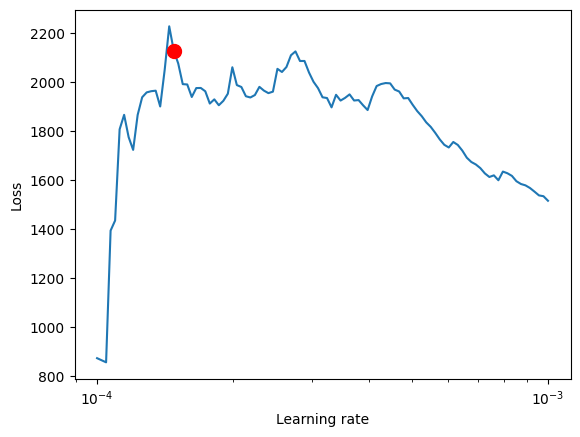

In [ ]:
params = {'hidden_size': 123, 'rnn_layers': 3, 'dropout': 0.18487681630503944, 'learning_rate': 0.0008010643213629334, 'gradient_clip_val': 0.8697288952064852, 'weight_decay': 0.002154903288059334, 'beta1': 0.9233268977967672, 'beta2': 0.9352611987163925, 'alpha': 0.5374590091127917, 'k': 7, 'lr_factor': 0.3124226578046911}

model = train_RNN(
    training=training,
    train_dataloader=train_dataloader,
    val_dataloader=val_dataloader,
    test_dataloader=test_dataloader,
    predict_dataloader=predict_dataloader,
    version="1",
    model="LSTM",
    hidden_size=params["hidden_size"],
    rnn_layers=params["rnn_layers"],
    dropout=params["dropout"],
    learning_rate=params["learning_rate"],
    output_size=1,
    gradient_clip_val=params["gradient_clip_val"],
    weight_decay=params["weight_decay"],
    beta1=params["beta1"],
    beta2=params["beta2"],
    alpha=params["alpha"],
    k=params["k"],
    lr_factor=params["lr_factor"],
    lr_patience=lr_patience,
    early_stop_min_delta=early_stop_min_delta,
    early_stop_patience=early_stop_patience,
    plot=True,
    trial=None,
    max_epoch=500,
    find_lr=True
)



INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42
INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: 
  | Name             | Type           | Params | Mode 
------------------------------------------------------------
0 | loss             | RMSE           | 0      | train
1 | logging_metrics  | ModuleList     | 0      | train
2 | embeddings       | MultiEmbedding | 2.6 K  | train
3 | rnn              | LSTM           | 360 K  | train
4 | output_projector | Linear         | 124    | train
-------------------

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric val_loss improved. New best score: 3666.662
INFO:lightning.pytorch.callbacks.early_stopping:Metric val_loss improved. New best score: 3666.662


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric val_loss improved by 289.697 >= min_delta = 5. New best score: 3376.965
INFO:lightning.pytorch.callbacks.early_stopping:Metric val_loss improved by 289.697 >= min_delta = 5. New best score: 3376.965


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric val_loss improved by 109.422 >= min_delta = 5. New best score: 3267.543
INFO:lightning.pytorch.callbacks.early_stopping:Metric val_loss improved by 109.422 >= min_delta = 5. New best score: 3267.543


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric val_loss improved by 92.745 >= min_delta = 5. New best score: 3174.798
INFO:lightning.pytorch.callbacks.early_stopping:Metric val_loss improved by 92.745 >= min_delta = 5. New best score: 3174.798


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Monitored metric val_loss did not improve in the last 8 records. Best score: 3174.798. Signaling Trainer to stop.
INFO:lightning.pytorch.callbacks.early_stopping:Monitored metric val_loss did not improve in the last 8 records. Best score: 3174.798. Signaling Trainer to stop.
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test_MAE          │     5414.41552734375      │
│         test_MAPE         │    0.05757959187030792    │
│         test_MASE         │    3.0554721355438232     │
│         test_RMSE         │     5905.22509765625      │
│        test_SMAPE         │    0.05568892881274223    │
│         test_loss         │     5905.22509765625      │
└───────────────────────────┴───────────────────────────┘

INFO: Using default `ModelCheckpoint`. Consider installing `litmodels` package to enable `LitModelCheckpoint` for automatic upload to the Lightning model registry.
INFO:lightning.pytorch.utilities.rank_zero:Using default `ModelCheckpoint`. Consider installing `litmodels` package to enable `LitModelCheckpoint` for automatic upload to the Lightning model registry.
INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Model shranjen na: /content/drive/My Drive/Magisterij_Bucar/Modeli/lstm_v3.ckpt


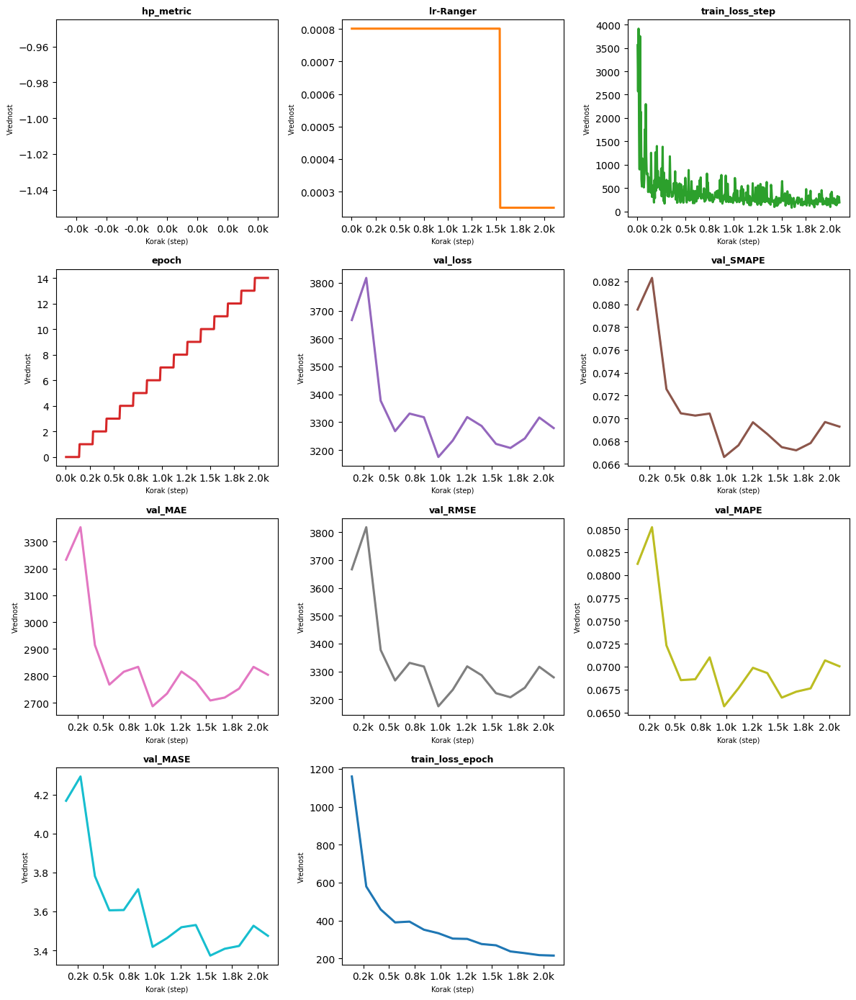

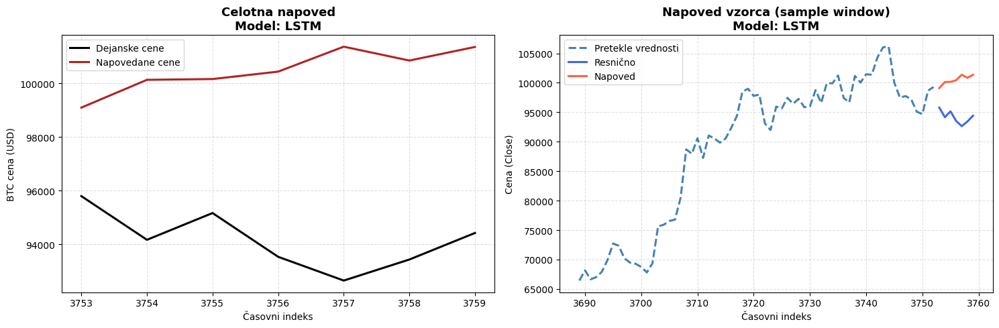

###############################
MAE:   6327.27
RMSE:  6535.32
MASE:  5.48
MAPE:  6.74
SMAPE: 6.50
AIC:   725855.00
BIC:   706227.62
Training time: 116.22 sec (1.94 min)
###############################


In [ ]:
params = {'hidden_size': 123, 'rnn_layers': 3, 'dropout': 0.18487681630503944, 'learning_rate': 0.0008010643213629334, 'gradient_clip_val': 0.8697288952064852, 'weight_decay': 0.002154903288059334, 'beta1': 0.9233268977967672, 'beta2': 0.9352611987163925, 'alpha': 0.5374590091127917, 'k': 7, 'lr_factor': 0.3124226578046911}

model = train_RNN(
    training=training,
    train_dataloader=train_dataloader,
    val_dataloader=val_dataloader,
    test_dataloader=test_dataloader,
    predict_dataloader=predict_dataloader,
    version="3",
    model="LSTM",
    hidden_size=params["hidden_size"],
    rnn_layers=params["rnn_layers"],
    dropout=params["dropout"],
    learning_rate=params["learning_rate"],
    output_size=1,
    gradient_clip_val=params["gradient_clip_val"],
    weight_decay=params["weight_decay"],
    beta1=params["beta1"],
    beta2=params["beta2"],
    alpha=params["alpha"],
    k=params["k"],
    lr_factor=params["lr_factor"],
    lr_patience=lr_patience,
    early_stop_min_delta=early_stop_min_delta,
    early_stop_patience=early_stop_patience,
    plot=True,
    trial=None,
    max_epoch=500,
    find_lr=False
)


## Optuna search - LSTM

In [ ]:
def objective(trial):
    params = {
        "version": f"optuna_{trial.number}",
        "hidden_size": trial.suggest_int("hidden_size", 36, 96),
        "rnn_layers": trial.suggest_int("rnn_layers", 1, 5),
        "dropout": trial.suggest_float("dropout", 0.1, 0.6),
        "learning_rate": trial.suggest_float("learning_rate", 1e-4, 1e-3, log=True),
        "gradient_clip_val": trial.suggest_float("gradient_clip_val", 0.01, 1.0),
        "weight_decay": trial.suggest_float("weight_decay", 1e-5, 1e-2, log=True),
        "beta1": trial.suggest_float("beta1", 0.85, 0.95),
        "beta2": trial.suggest_float("beta2", 0.90, 0.99),
        "alpha": trial.suggest_float("alpha", 0.3, 0.7),
        "k": trial.suggest_int("k", 5, 8),
        "lr_factor": trial.suggest_float("lr_factor", 0.3, 0.6),
        "lr_patience": 4,
        "min_lr": 1e-8,
        "plot": False,
        "trial": trial,
        "max_epoch": 100,
        "early_stop_min_delta": early_stop_min_delta,
        "early_stop_patience": early_stop_patience,
        "find_lr": False,
        "model": "LSTM",
    }

    model = train_RNN(
        training=training,
        train_dataloader=train_dataloader,
        val_dataloader=val_dataloader,
        test_dataloader=test_dataloader,
        predict_dataloader=predict_dataloader,
        **params
        )

    return model.val_loss if hasattr(model, "val_loss") else float("inf")

sampler = optuna.samplers.TPESampler(multivariate=True, seed=42)
pruner = optuna.pruners.MedianPruner(n_startup_trials=5, n_warmup_steps=3)

study = optuna.create_study(direction="minimize", sampler=sampler, pruner=pruner)
study.optimize(objective, n_trials=30)

# Najboljši rezultati
print("Najboljši parametri:", study.best_trial.params)
print("Najboljši rmse:", study.best_value)

[I 2025-05-07 11:09:49,149] A new study created in memory with name: no-name-923110a6-4c1a-4488-8c51-7473da026421
INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42
INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

[I 2025-05-07 11:11:56,492] Trial 0 finished with value: 3629.48681640625 and parameters: {'hidden_size': 58, 'rnn_layers': 5, 'dropout': 0.4659969709057026, 'learning_rate': 0.00039687933304443713, 'gradient_clip_val': 0.16445845403801215, 'weight_decay': 2.9375384576328295e-05, 'beta1': 0.8558083612168199, 'beta2': 0.9779558531197442, 'alpha': 0.5404460046972834, 'k': 7, 'lr_factor': 0.3061753482887407}. Best is trial 0 with value: 3629.48681640625.
INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42
INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOC

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

[I 2025-05-07 11:14:40,718] Trial 1 finished with value: 4465.7666015625 and parameters: {'hidden_size': 95, 'rnn_layers': 5, 'dropout': 0.20616955533913808, 'learning_rate': 0.0001519934830130982, 'gradient_clip_val': 0.1915704647548995, 'weight_decay': 8.17949947521167e-05, 'beta1': 0.9024756431632237, 'beta2': 0.9388750516777904, 'alpha': 0.41649165607921673, 'k': 7, 'lr_factor': 0.34184815819561254}. Best is trial 0 with value: 3629.48681640625.
INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42
INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

[I 2025-05-07 11:16:03,950] Trial 2 finished with value: 3337.697265625 and parameters: {'hidden_size': 53, 'rnn_layers': 2, 'dropout': 0.32803499210851794, 'learning_rate': 0.0006097839109531517, 'gradient_clip_val': 0.20767704433677614, 'weight_decay': 0.0003489018845491386, 'beta1': 0.9092414568862042, 'beta2': 0.9041805371447998, 'alpha': 0.5430179407605753, 'k': 5, 'lr_factor': 0.3195154778955838}. Best is trial 2 with value: 3337.697265625.
INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42
INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RA

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

[I 2025-05-07 11:17:57,116] Trial 3 finished with value: 3392.613037109375 and parameters: {'hidden_size': 93, 'rnn_layers': 5, 'dropout': 0.5041986740582306, 'learning_rate': 0.00020165721691808595, 'gradient_clip_val': 0.10669539286632003, 'weight_decay': 0.0011290133559092666, 'beta1': 0.8940152493739602, 'beta2': 0.9109834411360301, 'alpha': 0.498070764044508, 'k': 5, 'lr_factor': 0.5727961206236346}. Best is trial 2 with value: 3337.697265625.
INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42
INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

[I 2025-05-07 11:19:28,126] Trial 4 finished with value: 3641.204345703125 and parameters: {'hidden_size': 51, 'rnn_layers': 4, 'dropout': 0.2558555380447055, 'learning_rate': 0.000331182988807238, 'gradient_clip_val': 0.5512431765498469, 'weight_decay': 3.585612610345396e-05, 'beta1': 0.9469584627764558, 'beta2': 0.9697619541025003, 'alpha': 0.6757995766256756, 'k': 8, 'lr_factor': 0.47936999364332555}. Best is trial 2 with value: 3337.697265625.
INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42
INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_R

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

[I 2025-05-07 11:19:50,793] Trial 5 pruned. Trial was pruned at epoch 3.
INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42
INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

[I 2025-05-07 11:21:00,163] Trial 6 pruned. Trial was pruned at epoch 8.
INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42
INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

[I 2025-05-07 11:21:24,941] Trial 7 pruned. Trial was pruned at epoch 3.
INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42
INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

[I 2025-05-07 11:22:42,515] Trial 8 finished with value: 3576.986083984375 and parameters: {'hidden_size': 90, 'rnn_layers': 3, 'dropout': 0.15979712296915086, 'learning_rate': 0.0005167075260023275, 'gradient_clip_val': 0.7631771981307285, 'weight_decay': 0.00048287152161792117, 'beta1': 0.9270967179954561, 'beta2': 0.9444416036727952, 'alpha': 0.5090931317527976, 'k': 6, 'lr_factor': 0.30762573802322857}. Best is trial 2 with value: 3337.697265625.
INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42
INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCA

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

[I 2025-05-07 11:23:04,733] Trial 9 pruned. Trial was pruned at epoch 3.
INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42
INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

[I 2025-05-07 11:25:11,333] Trial 10 finished with value: 3261.927978515625 and parameters: {'hidden_size': 51, 'rnn_layers': 2, 'dropout': 0.4739019093767709, 'learning_rate': 0.0007805373779124267, 'gradient_clip_val': 0.23772066159206878, 'weight_decay': 0.00031942304829999047, 'beta1': 0.8831549981122856, 'beta2': 0.906121215640434, 'alpha': 0.6201904847768992, 'k': 5, 'lr_factor': 0.41916272290933865}. Best is trial 10 with value: 3261.927978515625.
INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42
INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

[I 2025-05-07 11:25:36,418] Trial 11 pruned. Trial was pruned at epoch 3.
INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42
INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

[I 2025-05-07 11:27:02,661] Trial 12 finished with value: 3524.323974609375 and parameters: {'hidden_size': 44, 'rnn_layers': 2, 'dropout': 0.5356787120941559, 'learning_rate': 0.0004329369484956152, 'gradient_clip_val': 0.055462536411168106, 'weight_decay': 0.0003218949215993077, 'beta1': 0.8866045845938129, 'beta2': 0.9098077813116235, 'alpha': 0.5940335062118312, 'k': 6, 'lr_factor': 0.46243641231709604}. Best is trial 10 with value: 3261.927978515625.
INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42
INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

[I 2025-05-07 11:28:15,245] Trial 13 finished with value: 3523.16455078125 and parameters: {'hidden_size': 82, 'rnn_layers': 1, 'dropout': 0.25647896080854904, 'learning_rate': 0.00036684503631078297, 'gradient_clip_val': 0.24709948599893725, 'weight_decay': 0.00045210973994777093, 'beta1': 0.9103580680586675, 'beta2': 0.9237502976118682, 'alpha': 0.55614976026311, 'k': 5, 'lr_factor': 0.32021488477340054}. Best is trial 10 with value: 3261.927978515625.
INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42
INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

[I 2025-05-07 11:28:41,872] Trial 14 pruned. Trial was pruned at epoch 3.
INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42
INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

[I 2025-05-07 11:30:31,672] Trial 15 finished with value: 3246.09619140625 and parameters: {'hidden_size': 66, 'rnn_layers': 2, 'dropout': 0.5618977920028976, 'learning_rate': 0.0009370329650720731, 'gradient_clip_val': 0.29162952025999206, 'weight_decay': 0.009099238155219777, 'beta1': 0.8993522448142595, 'beta2': 0.9042459695091642, 'alpha': 0.6322394944221236, 'k': 5, 'lr_factor': 0.45990692266198296}. Best is trial 15 with value: 3246.09619140625.
INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42
INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOC

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

[I 2025-05-07 11:33:00,556] Trial 16 finished with value: 3208.1552734375 and parameters: {'hidden_size': 69, 'rnn_layers': 2, 'dropout': 0.5603383864705248, 'learning_rate': 0.0008500828668390822, 'gradient_clip_val': 0.5790562834559226, 'weight_decay': 0.009066162848338688, 'beta1': 0.8606625779936609, 'beta2': 0.911484179153939, 'alpha': 0.6907166923569086, 'k': 6, 'lr_factor': 0.4267352965870747}. Best is trial 16 with value: 3208.1552734375.
INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42
INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RA

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

[I 2025-05-07 11:34:28,115] Trial 17 finished with value: 3232.177734375 and parameters: {'hidden_size': 83, 'rnn_layers': 2, 'dropout': 0.5341887603495383, 'learning_rate': 0.0006603902342033412, 'gradient_clip_val': 0.7814446689069579, 'weight_decay': 0.003146374164325903, 'beta1': 0.8692856417469211, 'beta2': 0.9217107993477234, 'alpha': 0.6926783389860625, 'k': 7, 'lr_factor': 0.43385081624555244}. Best is trial 16 with value: 3208.1552734375.
INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42
INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_R

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

[I 2025-05-07 11:34:51,319] Trial 18 pruned. Trial was pruned at epoch 3.
INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42
INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

[I 2025-05-07 11:36:12,510] Trial 19 finished with value: 3273.861083984375 and parameters: {'hidden_size': 81, 'rnn_layers': 2, 'dropout': 0.5038260871719158, 'learning_rate': 0.0003198580171384165, 'gradient_clip_val': 0.5078365037909879, 'weight_decay': 0.0014878817383177977, 'beta1': 0.8657597569829718, 'beta2': 0.9149065582997811, 'alpha': 0.6279749556555345, 'k': 7, 'lr_factor': 0.5320584035059539}. Best is trial 16 with value: 3208.1552734375.
INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42
INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCA

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

[I 2025-05-07 11:38:13,902] Trial 20 finished with value: 3347.869873046875 and parameters: {'hidden_size': 75, 'rnn_layers': 3, 'dropout': 0.4850104938577776, 'learning_rate': 0.0009528025541681593, 'gradient_clip_val': 0.6107266203516197, 'weight_decay': 0.0061617655816138895, 'beta1': 0.8534865283952966, 'beta2': 0.9313560017761726, 'alpha': 0.5926512929414758, 'k': 6, 'lr_factor': 0.3433020637286459}. Best is trial 16 with value: 3208.1552734375.
INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42
INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCA

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

[I 2025-05-07 11:38:48,388] Trial 21 pruned. Trial was pruned at epoch 5.
INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42
INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

[I 2025-05-07 11:40:27,332] Trial 22 finished with value: 3205.6123046875 and parameters: {'hidden_size': 69, 'rnn_layers': 2, 'dropout': 0.485104534506243, 'learning_rate': 0.0008922276504162329, 'gradient_clip_val': 0.8629247332872328, 'weight_decay': 0.008860749113805041, 'beta1': 0.9018626328198418, 'beta2': 0.9044869769654943, 'alpha': 0.6564994970574313, 'k': 7, 'lr_factor': 0.3926361913564118}. Best is trial 22 with value: 3205.6123046875.
INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42
INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RA

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

[I 2025-05-07 11:41:55,039] Trial 23 finished with value: 3178.1669921875 and parameters: {'hidden_size': 69, 'rnn_layers': 3, 'dropout': 0.4473074227150682, 'learning_rate': 0.0005406852053570248, 'gradient_clip_val': 0.9806756752543937, 'weight_decay': 0.0029409162468960323, 'beta1': 0.9116612518921186, 'beta2': 0.9127210173005972, 'alpha': 0.6378148891528617, 'k': 8, 'lr_factor': 0.31864750377172874}. Best is trial 23 with value: 3178.1669921875.
INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42
INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

[I 2025-05-07 11:42:28,643] Trial 24 pruned. Trial was pruned at epoch 4.
INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42
INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

[I 2025-05-07 11:44:02,008] Trial 25 finished with value: 3253.71240234375 and parameters: {'hidden_size': 74, 'rnn_layers': 4, 'dropout': 0.41918222379970255, 'learning_rate': 0.0002858933881947815, 'gradient_clip_val': 0.9663403914317076, 'weight_decay': 0.003645082704162998, 'beta1': 0.8917483364642358, 'beta2': 0.9237833973532571, 'alpha': 0.6296864871593258, 'k': 8, 'lr_factor': 0.34068037394887485}. Best is trial 23 with value: 3178.1669921875.
INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42
INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCA

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

[I 2025-05-07 11:45:08,546] Trial 26 finished with value: 3105.7529296875 and parameters: {'hidden_size': 53, 'rnn_layers': 3, 'dropout': 0.5564009967160615, 'learning_rate': 0.0008711476686830671, 'gradient_clip_val': 0.9984769591224418, 'weight_decay': 0.00356528275754138, 'beta1': 0.9328337723895048, 'beta2': 0.9367125572194243, 'alpha': 0.569680621459791, 'k': 8, 'lr_factor': 0.3259455083320286}. Best is trial 26 with value: 3105.7529296875.
INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42
INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RAN

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

[I 2025-05-07 11:45:34,064] Trial 27 pruned. Trial was pruned at epoch 3.
INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42
INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

[I 2025-05-07 11:46:05,646] Trial 28 pruned. Trial was pruned at epoch 3.
INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42
INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

[I 2025-05-07 11:46:45,434] Trial 29 pruned. Trial was pruned at epoch 5.


Najboljši parametri: {'hidden_size': 53, 'rnn_layers': 3, 'dropout': 0.5564009967160615, 'learning_rate': 0.0008711476686830671, 'gradient_clip_val': 0.9984769591224418, 'weight_decay': 0.00356528275754138, 'beta1': 0.9328337723895048, 'beta2': 0.9367125572194243, 'alpha': 0.569680621459791, 'k': 8, 'lr_factor': 0.3259455083320286}
Najboljši rmse: 3105.7529296875


In [ ]:
print("Best parameters:", study.best_params)
vis.plot_optimization_history(study).show()
vis.plot_param_importances(study).show()
vis.plot_parallel_coordinate(study).show()
vis.plot_contour(study).show()
vis.plot_slice(study).show()
vis.plot_edf(study).show()

Best parameters: {'hidden_size': 53, 'rnn_layers': 3, 'dropout': 0.5564009967160615, 'learning_rate': 0.0008711476686830671, 'gradient_clip_val': 0.9984769591224418, 'weight_decay': 0.00356528275754138, 'beta1': 0.9328337723895048, 'beta2': 0.9367125572194243, 'alpha': 0.569680621459791, 'k': 8, 'lr_factor': 0.3259455083320286}


# **GRU** - *Gated Recurrent Unit*

In [ ]:
training, train_dataloader, val_dataloader, test_dataloader, predict_dataloader = prepare_dataloaders(
    max_prediction_length=7,
    max_encoder_length=64,
    batch_size=16,
    target_lags=3,
    val_df_size=0.35,
    target_center=True,
    target_transformation="log")

INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42


Train size: 2321
Validation size: 1364
Test size: 75


In [ ]:
params = {'batch_size': 32, 'hidden_size': 80, 'rnn_layers': 2, 'dropout': 0.63359375608618406, 'learning_rate': 0.0007885215427204778, 'gradient_clip_val': 0.3077549287618563, 'weight_decay': 7.864318675077079e-04, 'beta1': 0.9141787411520972, 'beta2': 0.960300039734326, 'alpha': 0.5968962715195851, 'k': 6, 'lr_factor': 0.567153188665539, 'max_encoder_length': 55}

params = {'batch_size': 16, 'hidden_size': 40, 'rnn_layers': 3, 'dropout': 0.53359375608618406, 'learning_rate': 0.0007885215427204778, 'gradient_clip_val': 0.3077549287618563, 'weight_decay': 7.864318675077079e-03, 'beta1': 0.9141787411520972, 'beta2': 0.960300039734326, 'alpha': 0.5968962715195851, 'k': 6, 'lr_factor': 0.567153188665539, 'max_encoder_length': 55}

params = {'batch_size': 16, 'hidden_size': 40, 'rnn_layers': 3, 'dropout': 0.43359375608618406, 'learning_rate': 0.0007885215427204778, 'gradient_clip_val': 0.3077549287618563, 'weight_decay': 7.864318675077079e-07, 'beta1': 0.9141787411520972, 'beta2': 0.960300039734326, 'alpha': 0.5968962715195851, 'k': 6, 'lr_factor': 0.567153188665539, 'max_encoder_length': 55}

params = {'batch_size': 16, 'hidden_size': 124, 'rnn_layers': 1, 'dropout': 0.36332835032982556, 'learning_rate': 0.0027244827028420327, 'gradient_clip_val': 0.5532196622444417, 'weight_decay': 6.653913092603406e-09, 'beta1': 0.9323176772987475, 'beta2': 0.9261512320340699, 'alpha': 0.44682754517920364, 'k': 5, 'lr_factor': 0.5958356083163308, 'max_encoder_length': 120}

param = {'batch_size': 16, 'rnn_layers': 1, 'hidden_size': 68, 'dropout': 0.3408513777964699, 'learning_rate': 0.003099472005614043, 'gradient_clip_val': 0.744292967336111, 'weight_decay': 5.602987233471763e-08, 'beta1': 0.9038371351615602, 'beta2': 0.9663676473434836, 'alpha': 0.7194959050391624, 'k': 9, 'lr_factor': 0.3551932708058716, 'max_encoder_length': 40}


## LR search

INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42
INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Finding best initial lr:   0%|          | 0/100 [00:00<?, ?it/s]

INFO: `Trainer.fit` stopped: `max_steps=100` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=100` reached.
INFO: Learning rate set to 0.0001380384264602885
INFO:lightning.pytorch.tuner.lr_finder:Learning rate set to 0.0001380384264602885
INFO: Restoring states from the checkpoint path at /content/.lr_find_173642e2-82e9-4dd2-881c-e39a7425c66e.ckpt
INFO:lightning.pytorch.utilities.rank_zero:Restoring states from the checkpoint path at /content/.lr_find_173642e2-82e9-4dd2-881c-e39a7425c66e.ckpt
INFO: Restored all states from the checkpoint at /content/.lr_find_173642e2-82e9-4dd2-881c-e39a7425c66e.ckpt
INFO:lightning.pytorch.utilities.rank_zero:Restored all states from the checkpoint at /content/.lr_find_173642e2-82e9-4dd2-881c-e39a7425c66e.ckpt


Predlagan LR: 0.0001380384264602885


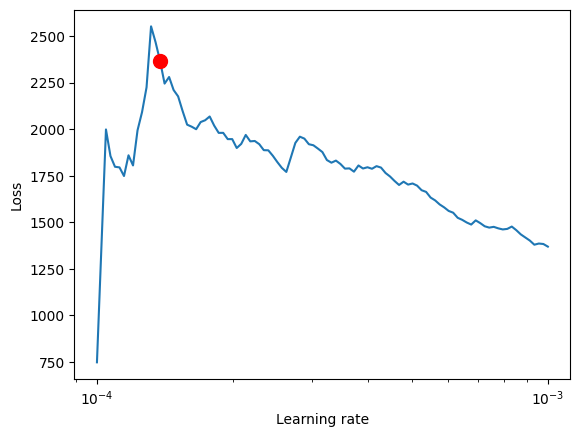

In [ ]:
params = {
    "hidden_size": 96,
    "rnn_layers": 4,
    "dropout": 0.5057999394083728,
    "learning_rate": 0.0007653654402007956,
    "gradient_clip_val": 0.6167393948170666,
    "weight_decay": 0.0014038978532141479,
    "beta1": 0.892987651377795,
    "beta2": 0.940960486501422,
    "alpha": 0.3975157188415666,
    "k": 8,
    "lr_factor": 0.33856479454780214
}

model = train_RNN(
    training=training,
    train_dataloader=train_dataloader,
    val_dataloader=val_dataloader,
    test_dataloader=test_dataloader,
    predict_dataloader=predict_dataloader,
    version="2",
    model="GRU",
    hidden_size=params["hidden_size"],
    rnn_layers=params["rnn_layers"],
    dropout=params["dropout"],
    learning_rate=params["learning_rate"],
    output_size=1,
    gradient_clip_val=params["gradient_clip_val"],
    weight_decay=params["weight_decay"],
    beta1=params["beta1"],
    beta2=params["beta2"],
    alpha=params["alpha"],
    k=params["k"],
    lr_factor=params["lr_factor"],
    lr_patience=lr_patience,
    early_stop_min_delta=early_stop_min_delta,
    early_stop_patience=early_stop_patience,
    plot=True,
    trial=None,
    max_epoch=500,
    find_lr=True
)


INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42
INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: 
  | Name             | Type           | Params | Mode 
------------------------------------------------------------
0 | loss             | RMSE           | 0      | train
1 | logging_metrics  | ModuleList     | 0      | train
2 | embeddings       | MultiEmbedding | 2.6 K  | train
3 | rnn              | GRU            | 227 K  | train
4 | output_projector | Linear         | 97     | train
-------------------

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric val_loss improved. New best score: 4922.353
INFO:lightning.pytorch.callbacks.early_stopping:Metric val_loss improved. New best score: 4922.353


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric val_loss improved by 1123.704 >= min_delta = 5. New best score: 3798.649
INFO:lightning.pytorch.callbacks.early_stopping:Metric val_loss improved by 1123.704 >= min_delta = 5. New best score: 3798.649


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric val_loss improved by 52.786 >= min_delta = 5. New best score: 3745.864
INFO:lightning.pytorch.callbacks.early_stopping:Metric val_loss improved by 52.786 >= min_delta = 5. New best score: 3745.864


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric val_loss improved by 405.056 >= min_delta = 5. New best score: 3340.808
INFO:lightning.pytorch.callbacks.early_stopping:Metric val_loss improved by 405.056 >= min_delta = 5. New best score: 3340.808


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric val_loss improved by 178.803 >= min_delta = 5. New best score: 3162.005
INFO:lightning.pytorch.callbacks.early_stopping:Metric val_loss improved by 178.803 >= min_delta = 5. New best score: 3162.005


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric val_loss improved by 32.836 >= min_delta = 5. New best score: 3129.169
INFO:lightning.pytorch.callbacks.early_stopping:Metric val_loss improved by 32.836 >= min_delta = 5. New best score: 3129.169


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric val_loss improved by 65.826 >= min_delta = 5. New best score: 3063.343
INFO:lightning.pytorch.callbacks.early_stopping:Metric val_loss improved by 65.826 >= min_delta = 5. New best score: 3063.343


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric val_loss improved by 22.233 >= min_delta = 5. New best score: 3041.110
INFO:lightning.pytorch.callbacks.early_stopping:Metric val_loss improved by 22.233 >= min_delta = 5. New best score: 3041.110


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric val_loss improved by 16.798 >= min_delta = 5. New best score: 3024.312
INFO:lightning.pytorch.callbacks.early_stopping:Metric val_loss improved by 16.798 >= min_delta = 5. New best score: 3024.312


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric val_loss improved by 10.226 >= min_delta = 5. New best score: 3014.086
INFO:lightning.pytorch.callbacks.early_stopping:Metric val_loss improved by 10.226 >= min_delta = 5. New best score: 3014.086


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric val_loss improved by 40.407 >= min_delta = 5. New best score: 2973.679
INFO:lightning.pytorch.callbacks.early_stopping:Metric val_loss improved by 40.407 >= min_delta = 5. New best score: 2973.679


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric val_loss improved by 9.979 >= min_delta = 5. New best score: 2963.699
INFO:lightning.pytorch.callbacks.early_stopping:Metric val_loss improved by 9.979 >= min_delta = 5. New best score: 2963.699


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric val_loss improved by 35.164 >= min_delta = 5. New best score: 2928.535
INFO:lightning.pytorch.callbacks.early_stopping:Metric val_loss improved by 35.164 >= min_delta = 5. New best score: 2928.535


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Monitored metric val_loss did not improve in the last 8 records. Best score: 2928.535. Signaling Trainer to stop.
INFO:lightning.pytorch.callbacks.early_stopping:Monitored metric val_loss did not improve in the last 8 records. Best score: 2928.535. Signaling Trainer to stop.
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test_MAE          │      5266.5927734375      │
│         test_MAPE         │    0.05596933886408806    │
│         test_MASE         │    2.9719388484954834     │
│         test_RMSE         │          5726.5           │
│        test_SMAPE         │    0.05420074984431267    │
│         test_loss         │          5726.5           │
└───────────────────────────┴───────────────────────────┘

INFO: Using default `ModelCheckpoint`. Consider installing `litmodels` package to enable `LitModelCheckpoint` for automatic upload to the Lightning model registry.
INFO:lightning.pytorch.utilities.rank_zero:Using default `ModelCheckpoint`. Consider installing `litmodels` package to enable `LitModelCheckpoint` for automatic upload to the Lightning model registry.
INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Model shranjen na: /content/drive/My Drive/Magisterij_Bucar/Modeli/gru_v1.ckpt


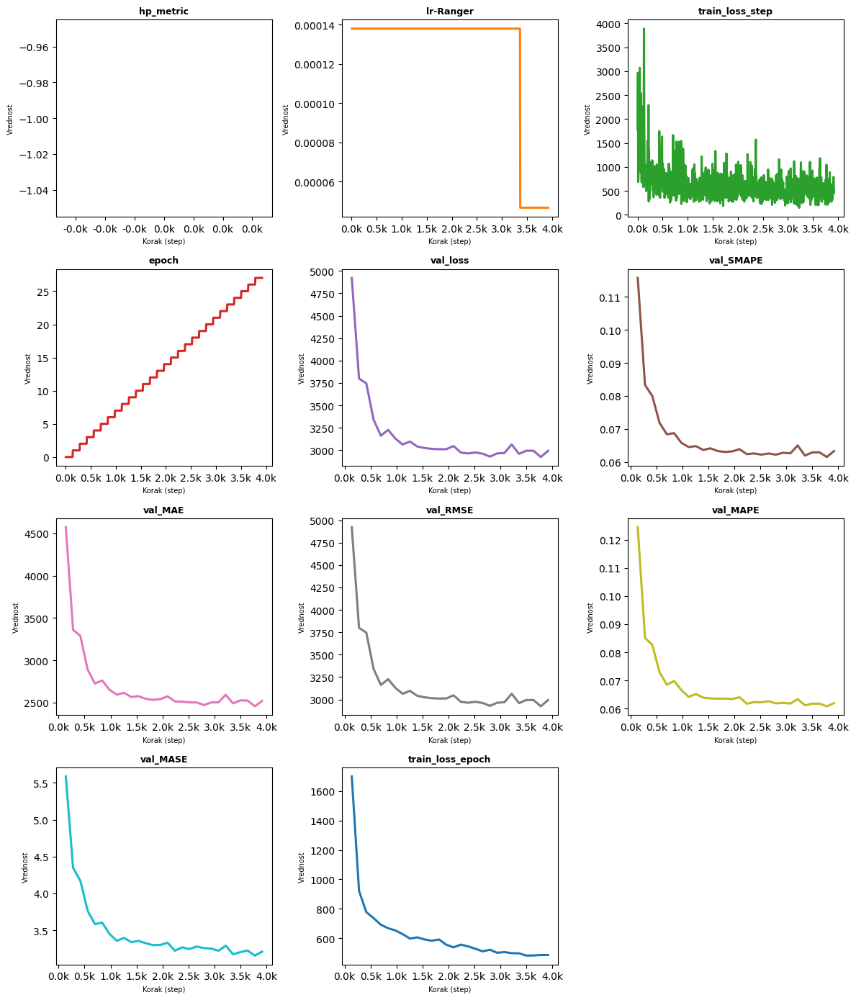

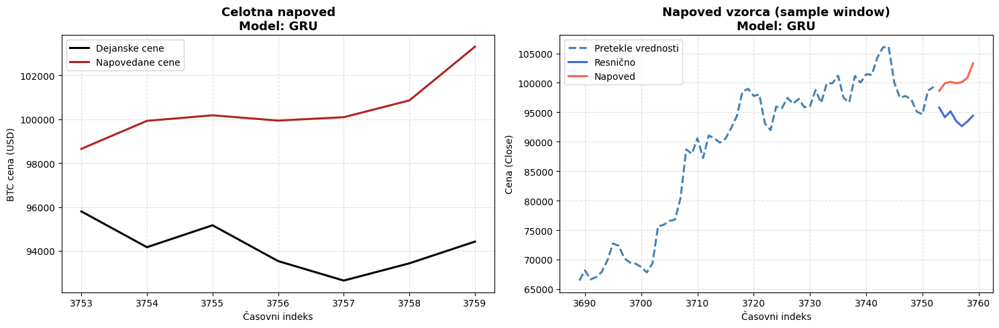

###############################
MAE:   6255.51
RMSE:  6513.93
MASE:  5.42
MAPE:  6.66
SMAPE: 6.43
AIC:   461128.94
BIC:   448661.07
Training time: 196.37 sec (3.27 min)
###############################


In [ ]:
params = {
    "hidden_size": 96,
    "rnn_layers": 4,
    "dropout": 0.5057999394083728,
    "learning_rate": 0.0007653654402007956,
    "gradient_clip_val": 0.6167393948170666,
    "weight_decay": 0.0014038978532141479,
    "beta1": 0.892987651377795,
    "beta2": 0.940960486501422,
    "alpha": 0.3975157188415666,
    "k": 8,
    "lr_factor": 0.33856479454780214
}

model = train_RNN(
    training=training,
    train_dataloader=train_dataloader,
    val_dataloader=val_dataloader,
    test_dataloader=test_dataloader,
    predict_dataloader=predict_dataloader,
    version="1",
    model="GRU",
    hidden_size=params["hidden_size"],
    rnn_layers=params["rnn_layers"],
    dropout=params["dropout"],
    learning_rate=0.0001380384264602885, #params["learning_rate"],
    output_size=1,
    gradient_clip_val=params["gradient_clip_val"],
    weight_decay=params["weight_decay"],
    beta1=params["beta1"],
    beta2=params["beta2"],
    alpha=params["alpha"],
    k=params["k"],
    lr_factor=params["lr_factor"],
    lr_patience=lr_patience,
    early_stop_min_delta=early_stop_min_delta,
    early_stop_patience=early_stop_patience,
    plot=True,
    trial=None,
    max_epoch=500,
    find_lr=False
)


## Optuna search - GRU

In [ ]:
def objective(trial):
    params = {
        "version": f"optuna_{trial.number}",
        "hidden_size": trial.suggest_int("hidden_size", 36, 96),
        "rnn_layers": trial.suggest_int("rnn_layers", 1, 5),
        "dropout": trial.suggest_float("dropout", 0.1, 0.6),
        "learning_rate": trial.suggest_float("learning_rate", 1e-4, 1e-3, log=True),
        "gradient_clip_val": trial.suggest_float("gradient_clip_val", 0.01, 1.0),
        "weight_decay": trial.suggest_float("weight_decay", 1e-5, 1e-2, log=True),
        "beta1": trial.suggest_float("beta1", 0.85, 0.95),
        "beta2": trial.suggest_float("beta2", 0.90, 0.99),
        "alpha": trial.suggest_float("alpha", 0.3, 0.7),
        "k": trial.suggest_int("k", 5, 8),
        "lr_factor": trial.suggest_float("lr_factor", 0.3, 0.6),
        "lr_patience": 4,
        "min_lr": 1e-8,
        "plot": False,
        "trial": trial,
        "max_epoch": 100,
        "early_stop_min_delta": early_stop_min_delta,
        "early_stop_patience": early_stop_patience,
        "find_lr": False,
        "model": "GRU",
    }

    model = train_RNN(
        training=training,
        train_dataloader=train_dataloader,
        val_dataloader=val_dataloader,
        test_dataloader=test_dataloader,
        predict_dataloader=predict_dataloader,
        **params
        )

    return model.val_loss if hasattr(model, "val_loss") else float("inf")

sampler = optuna.samplers.TPESampler(multivariate=True, seed=42)
pruner = optuna.pruners.MedianPruner(n_startup_trials=5, n_warmup_steps=3)

study = optuna.create_study(direction="minimize", sampler=sampler, pruner=pruner)
study.optimize(objective, n_trials=30)

# Najboljši rezultati
print("Najboljši parametri:", study.best_trial.params)
print("Najboljši rmse:", study.best_value)

[I 2025-05-06 06:19:00,389] A new study created in memory with name: no-name-74711437-fd2d-4caa-82f3-9f6b6f5f843a
INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42


######################
Train size: 2321
Validation size: 1364
Test size: 75
######################


INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

[I 2025-05-06 06:23:07,876] Trial 0 finished with value: 3339.13232421875 and parameters: {'hidden_size': 48, 'rnn_layers': 5, 'dropout': 0.20584965287905574, 'learning_rate': 0.00021660288526921268, 'gradient_clip_val': 0.352809877142789, 'weight_decay': 0.009847952841294874, 'beta1': 0.8608284897062092, 'beta2': 0.9139112027273122, 'alpha': 0.5976611315876774, 'k': 5, 'lr_factor': 0.30278397639380433}. Best is trial 0 with value: 3339.13232421875.
INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42


######################
Train size: 2321
Validation size: 1364
Test size: 75
######################


INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

[I 2025-05-06 06:25:12,008] Trial 1 finished with value: 3473.35107421875 and parameters: {'hidden_size': 48, 'rnn_layers': 4, 'dropout': 0.43977759082890433, 'learning_rate': 0.0003260887104719965, 'gradient_clip_val': 0.18506046848642405, 'weight_decay': 0.0057463261275218485, 'beta1': 0.9448212855706887, 'beta2': 0.9481810329000171, 'alpha': 0.6394419362317599, 'k': 6, 'lr_factor': 0.5777364229365851}. Best is trial 0 with value: 3339.13232421875.
INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42


######################
Train size: 2321
Validation size: 1364
Test size: 75
######################


INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

[I 2025-05-06 06:27:54,226] Trial 2 finished with value: 3528.41552734375 and parameters: {'hidden_size': 42, 'rnn_layers': 5, 'dropout': 0.49138238405223167, 'learning_rate': 0.0008961138581013801, 'gradient_clip_val': 0.026176502753028713, 'weight_decay': 2.3068697373272343e-05, 'beta1': 0.86598382241497, 'beta2': 0.9142092454261651, 'alpha': 0.5213711595551045, 'k': 8, 'lr_factor': 0.4822635996606535}. Best is trial 0 with value: 3339.13232421875.
INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42


######################
Train size: 2321
Validation size: 1364
Test size: 75
######################


INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

[I 2025-05-06 06:30:16,165] Trial 3 finished with value: 3109.18701171875 and parameters: {'hidden_size': 71, 'rnn_layers': 3, 'dropout': 0.1558678188488615, 'learning_rate': 0.00031449700701934095, 'gradient_clip_val': 0.5240165936167419, 'weight_decay': 2.2773097630144363e-05, 'beta1': 0.9034477887639869, 'beta2': 0.984650873551077, 'alpha': 0.44324924101011487, 'k': 8, 'lr_factor': 0.5302422186592601}. Best is trial 3 with value: 3109.18701171875.
INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42


######################
Train size: 2321
Validation size: 1364
Test size: 75
######################


INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

[I 2025-05-06 06:31:29,322] Trial 4 finished with value: 3196.6572265625 and parameters: {'hidden_size': 41, 'rnn_layers': 2, 'dropout': 0.4594578979987909, 'learning_rate': 0.0009663168877455022, 'gradient_clip_val': 0.3750730085866942, 'weight_decay': 0.00023504179578317673, 'beta1': 0.8729827126956227, 'beta2': 0.9378108602021634, 'alpha': 0.5677106866279157, 'k': 7, 'lr_factor': 0.41499940739058605}. Best is trial 3 with value: 3109.18701171875.
INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42


######################
Train size: 2321
Validation size: 1364
Test size: 75
######################


INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

[I 2025-05-06 06:33:07,970] Trial 5 finished with value: 3084.633544921875 and parameters: {'hidden_size': 62, 'rnn_layers': 3, 'dropout': 0.41574874763216496, 'learning_rate': 0.00025518292297648193, 'gradient_clip_val': 0.9978231943137222, 'weight_decay': 5.160103116890738e-05, 'beta1': 0.8893612581214253, 'beta2': 0.9487831784731087, 'alpha': 0.6730998698506853, 'k': 8, 'lr_factor': 0.31876371228318195}. Best is trial 5 with value: 3084.633544921875.
INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42


######################
Train size: 2321
Validation size: 1364
Test size: 75
######################


INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

[I 2025-05-06 06:33:14,670] Trial 6 pruned. Trial was pruned at epoch 0.
INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42


######################
Train size: 2321
Validation size: 1364
Test size: 75
######################


INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

[I 2025-05-06 06:34:45,563] Trial 7 finished with value: 3049.3330078125 and parameters: {'hidden_size': 89, 'rnn_layers': 4, 'dropout': 0.5401596380253346, 'learning_rate': 0.0008500218856472099, 'gradient_clip_val': 0.5351780190770385, 'weight_decay': 5.0155595206387964e-05, 'beta1': 0.8558093130884973, 'beta2': 0.9023558548449906, 'alpha': 0.5472390538779632, 'k': 8, 'lr_factor': 0.5996134644106826}. Best is trial 7 with value: 3049.3330078125.
INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42


######################
Train size: 2321
Validation size: 1364
Test size: 75
######################


INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

[I 2025-05-06 06:34:54,024] Trial 8 pruned. Trial was pruned at epoch 0.
INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42


######################
Train size: 2321
Validation size: 1364
Test size: 75
######################


INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

[I 2025-05-06 06:35:02,921] Trial 9 pruned. Trial was pruned at epoch 0.
INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42


######################
Train size: 2321
Validation size: 1364
Test size: 75
######################


INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

[I 2025-05-06 06:35:10,229] Trial 10 pruned. Trial was pruned at epoch 0.
INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42


######################
Train size: 2321
Validation size: 1364
Test size: 75
######################


INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

[I 2025-05-06 06:35:18,131] Trial 11 pruned. Trial was pruned at epoch 0.
INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42


######################
Train size: 2321
Validation size: 1364
Test size: 75
######################


INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

[I 2025-05-06 06:35:26,228] Trial 12 pruned. Trial was pruned at epoch 0.
INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42


######################
Train size: 2321
Validation size: 1364
Test size: 75
######################


INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

[I 2025-05-06 06:36:50,540] Trial 13 finished with value: 3416.143310546875 and parameters: {'hidden_size': 61, 'rnn_layers': 2, 'dropout': 0.41774357110160953, 'learning_rate': 0.0005587326627318844, 'gradient_clip_val': 0.8030503728981365, 'weight_decay': 5.7998511829229535e-05, 'beta1': 0.8820056734611467, 'beta2': 0.9592359698896226, 'alpha': 0.6905207040344811, 'k': 8, 'lr_factor': 0.5416871213499144}. Best is trial 7 with value: 3049.3330078125.
INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42


######################
Train size: 2321
Validation size: 1364
Test size: 75
######################


INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

[I 2025-05-06 06:36:58,066] Trial 14 pruned. Trial was pruned at epoch 0.
INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42


######################
Train size: 2321
Validation size: 1364
Test size: 75
######################


INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

[I 2025-05-06 06:37:06,341] Trial 15 pruned. Trial was pruned at epoch 0.
INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42


######################
Train size: 2321
Validation size: 1364
Test size: 75
######################


INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

[I 2025-05-06 06:37:12,853] Trial 16 pruned. Trial was pruned at epoch 0.
INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42


######################
Train size: 2321
Validation size: 1364
Test size: 75
######################


INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

[I 2025-05-06 06:37:20,731] Trial 17 pruned. Trial was pruned at epoch 0.
INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42


######################
Train size: 2321
Validation size: 1364
Test size: 75
######################


INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

[I 2025-05-06 06:37:29,135] Trial 18 pruned. Trial was pruned at epoch 0.
INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42


######################
Train size: 2321
Validation size: 1364
Test size: 75
######################


INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

[I 2025-05-06 06:37:36,237] Trial 19 pruned. Trial was pruned at epoch 0.
INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42


######################
Train size: 2321
Validation size: 1364
Test size: 75
######################


INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

[I 2025-05-06 06:39:29,483] Trial 20 finished with value: 2892.67578125 and parameters: {'hidden_size': 96, 'rnn_layers': 4, 'dropout': 0.5057999394083728, 'learning_rate': 0.0007653654402007956, 'gradient_clip_val': 0.6167393948170666, 'weight_decay': 0.0014038978532141479, 'beta1': 0.892987651377795, 'beta2': 0.940960486501422, 'alpha': 0.3975157188415666, 'k': 8, 'lr_factor': 0.33856479454780214}. Best is trial 20 with value: 2892.67578125.
INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42


######################
Train size: 2321
Validation size: 1364
Test size: 75
######################


INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

[I 2025-05-06 06:39:37,626] Trial 21 pruned. Trial was pruned at epoch 0.
INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42


######################
Train size: 2321
Validation size: 1364
Test size: 75
######################


INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

[I 2025-05-06 06:39:45,102] Trial 22 pruned. Trial was pruned at epoch 0.
INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42


######################
Train size: 2321
Validation size: 1364
Test size: 75
######################


INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

[I 2025-05-06 06:40:01,148] Trial 23 pruned. Trial was pruned at epoch 1.
INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42


######################
Train size: 2321
Validation size: 1364
Test size: 75
######################


INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

[I 2025-05-06 06:40:08,543] Trial 24 pruned. Trial was pruned at epoch 0.
INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42


######################
Train size: 2321
Validation size: 1364
Test size: 75
######################


INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

[I 2025-05-06 06:40:16,459] Trial 25 pruned. Trial was pruned at epoch 0.
INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42


######################
Train size: 2321
Validation size: 1364
Test size: 75
######################


INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

[I 2025-05-06 06:40:24,396] Trial 26 pruned. Trial was pruned at epoch 0.
INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42


######################
Train size: 2321
Validation size: 1364
Test size: 75
######################


INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

[I 2025-05-06 06:44:55,415] Trial 27 finished with value: 3041.215576171875 and parameters: {'hidden_size': 96, 'rnn_layers': 5, 'dropout': 0.44197189047119073, 'learning_rate': 0.0007476145980517615, 'gradient_clip_val': 0.582839260796678, 'weight_decay': 3.861716098005573e-05, 'beta1': 0.9059945457841456, 'beta2': 0.9314003334727474, 'alpha': 0.5443687128566466, 'k': 8, 'lr_factor': 0.34637718020729535}. Best is trial 20 with value: 2892.67578125.
INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42


######################
Train size: 2321
Validation size: 1364
Test size: 75
######################


INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

[I 2025-05-06 06:46:27,924] Trial 28 finished with value: 2993.5966796875 and parameters: {'hidden_size': 96, 'rnn_layers': 5, 'dropout': 0.4570911204311383, 'learning_rate': 0.0007513040949307789, 'gradient_clip_val': 0.5855330845305409, 'weight_decay': 3.156878507192898e-05, 'beta1': 0.9233769827863342, 'beta2': 0.9173739153648985, 'alpha': 0.5289797545200264, 'k': 6, 'lr_factor': 0.3858831243329689}. Best is trial 20 with value: 2892.67578125.
INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42


######################
Train size: 2321
Validation size: 1364
Test size: 75
######################


INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

[I 2025-05-06 06:46:37,322] Trial 29 pruned. Trial was pruned at epoch 0.


Najboljši parametri: {'hidden_size': 96, 'rnn_layers': 4, 'dropout': 0.5057999394083728, 'learning_rate': 0.0007653654402007956, 'gradient_clip_val': 0.6167393948170666, 'weight_decay': 0.0014038978532141479, 'beta1': 0.892987651377795, 'beta2': 0.940960486501422, 'alpha': 0.3975157188415666, 'k': 8, 'lr_factor': 0.33856479454780214}
Najboljši rmse: 2892.67578125


In [ ]:
print("Best parameters:", study.best_params)
vis.plot_optimization_history(study).show()
vis.plot_param_importances(study).show()
vis.plot_parallel_coordinate(study).show()
vis.plot_contour(study).show()
vis.plot_slice(study).show()
vis.plot_edf(study).show()

Best parameters: {'hidden_size': 96, 'rnn_layers': 4, 'dropout': 0.5057999394083728, 'learning_rate': 0.0007653654402007956, 'gradient_clip_val': 0.6167393948170666, 'weight_decay': 0.0014038978532141479, 'beta1': 0.892987651377795, 'beta2': 0.940960486501422, 'alpha': 0.3975157188415666, 'k': 8, 'lr_factor': 0.33856479454780214}


# **TFT** - *Temporal Fusion Transformer*

In [ ]:
training, train_dataloader, val_dataloader, test_dataloader, predict_dataloader = prepare_dataloaders(
    max_prediction_length=7,
    max_encoder_length=64,
    batch_size=16,
    target_lags=3,
    val_df_size=0.35,
    target_center=True,
    target_transformation="log")

INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42


Train size: 2321
Validation size: 1364
Test size: 75


In [ ]:
class MyTFT(TemporalFusionTransformer):
    def __init__(self, *args, beta1=0.9, beta2=0.999, weight_decay=0.0, alpha=0.5, k=6, lr_factor=.67, lr_patience=10, min_lr=1e-9, **kwargs):
      self.save_hyperparameters(ignore=["loss", "logging_metrics"])  # shrani beta1/beta2
      super().__init__(**kwargs)
      self.training_time = None

    def configure_optimizers(self):
        optimizer = Ranger(
        self.parameters(),
        lr=self.hparams.learning_rate,
        alpha=self.hparams.alpha,
        k=self.hparams.k,
        betas=(self.hparams.beta1, self.hparams.beta2),
        eps=1e-8,
        weight_decay=self.hparams.weight_decay,
        use_gc=True,
        gc_conv_only=False,
        amsgrad=False

        )

        scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
            optimizer,
            mode="min",
            factor=self.hparams.lr_factor,
            patience=self.hparams.lr_patience,
            min_lr=self.hparams.min_lr,
            verbose=True,
        )

        return {
            "optimizer": optimizer,
            "lr_scheduler": {
                "scheduler": scheduler,
                "monitor": "val_loss",
                "interval": "epoch",
                "frequency": 1
            }
        }

    def on_train_start(self):
      self.log("initial_lr", self.trainer.optimizers[0].param_groups[0]["lr"], prog_bar=False, logger=True)

    def on_train_epoch_end(self):
        current_lr = self.trainer.optimizers[0].param_groups[0]["lr"]
        self.log("lr", current_lr, prog_bar=True, logger=True)


In [ ]:
def train_tft(
    training,
    train_dataloader,
    val_dataloader,
    test_dataloader,
    predict_dataloader,
    version="1",
    learning_rate=0.00022130947096056378,
    hidden_size=32,
    attention_head_size=2,
    dropout=.3,
    hidden_continuous_size=16,
    accumulate_grad_batches=1,
    beta1=.92,
    beta2=.97,
    gradient_clip_val=1,
    weight_decay=1e-5,
    alpha=0.5,
    k=6,
    lr_factor=0.75,
    lr_patience=3,
    min_lr=1e-9,
    plot=True,
    trial=None,
    max_epoch=500,
    find_lr=False,
    early_stop_patience=8,
    early_stop_min_delta=1e-3,
):
    model_tag = "TFT"
    model_name = f"TFT_v{version}"
    seed_everything(42, workers=True)

    model = MyTFT.from_dataset(
        training,
        learning_rate=learning_rate,
        hidden_size=hidden_size,
        attention_head_size=attention_head_size,
        dropout=dropout,
        hidden_continuous_size=hidden_continuous_size,
        loss=RMSE(),
        log_interval=1,
        beta1=beta1,
        beta2=beta2,
        weight_decay=weight_decay,
    )

    callbacks = [
        EarlyStopping(monitor="val_loss", patience=early_stop_patience, min_delta=early_stop_min_delta, verbose=plot),
        LearningRateMonitor(logging_interval="step"),
        ModelCheckpoint(
            monitor="val_loss",
            dirpath=os.path.join(save_dir_lightning, model_name.split("_")[0], model_name),
            filename="best-checkpoint",
            save_top_k=1,
            mode="min"
        )
    ]
    if trial is not None:
        callbacks.append(PyTorchLightningPruningCallback(trial, monitor="val_loss"))

    logger = TensorBoardLogger(
        save_dir=save_dir_lightning,
        name=model_name.split("_")[0],
        version=model_name
    )

    trainer = Trainer(
        max_epochs=max_epoch,
        gradient_clip_val=gradient_clip_val,
        callbacks=callbacks,
        accelerator="gpu",
        devices=1,
        enable_progress_bar=True,
        log_every_n_steps=5,
        logger=logger,
        enable_model_summary=plot,
        accumulate_grad_batches=accumulate_grad_batches
    )

    if find_lr:
        tuner = Tuner(trainer)
        lr_finder = tuner.lr_find(
            model=model,
            min_lr=1e-4,
            max_lr=1e-3,
            num_training=100,
            train_dataloaders=train_dataloader,
            val_dataloaders=val_dataloader
        )
        print(f"Predlagan LR: {lr_finder.suggestion()}")
        return None

    start_time = time.time()
    trainer.fit(model, train_dataloader, val_dataloader)
    elapsed_time = time.time() - start_time

    model = MyTFT.load_from_checkpoint(trainer.checkpoint_callback.best_model_path)
    model.training_time = elapsed_time

    if trial is not None:
        model.val_loss = callbacks[0].best_score.item()
        return model

    trainer.test(model, test_dataloader)
    raw_output = model.predict(predict_dataloader, mode="raw", return_x=True)

    x = raw_output.x
    preds = raw_output.output.prediction

    decoded_preds, decoded_actuals, decoded_times = [], [], []
    for i in range(len(preds)):
        decoded_preds.append(preds[i, :, 0].detach().cpu().numpy())
        decoded_actuals.append(x["decoder_target"][i].detach().cpu().numpy())
        decoded_times.append(x["decoder_time_idx"][i].detach().cpu().numpy())

    df_plot = pd.DataFrame({
        "time_idx": np.concatenate(decoded_times),
        "y_pred": np.concatenate(decoded_preds),
        "y_true": np.concatenate(decoded_actuals),
    })

    mae = mean_absolute_error(df_plot["y_true"], df_plot["y_pred"])
    rmse = np.sqrt(mean_squared_error(df_plot["y_true"], df_plot["y_pred"]))
    mase = mae / np.mean(np.abs(df_plot["y_true"].diff().dropna()))
    mape = np.mean(np.abs((df_plot["y_true"] - df_plot["y_pred"]) / df_plot["y_true"])) * 100
    smape = np.mean(np.abs(df_plot["y_pred"] - df_plot["y_true"]) / ((np.abs(df_plot["y_true"]) + np.abs(df_plot["y_pred"])) / 2)) * 100

    n = len(df_plot)
    rss = np.sum((df_plot["y_true"] - df_plot["y_pred"]) ** 2)
    k_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
    aic = n * np.log(rss / n) + 2 * k_params
    bic = n * np.log(rss / n) + k_params * np.log(n)

    if plot:
        model_save_path = os.path.join(save_dir_modeli, f"{model_name.lower()}.ckpt")
        trainer.save_checkpoint(model_save_path)
        print(f"Model shranjen na: {model_save_path}")

        plot_training_metrics(model_name, save_dir_lightning, save_dir_slike)

        fig, axs = plt.subplots(1, 2, figsize=(15, 5))

        sns.lineplot(data=df_plot, x="time_idx", y="y_true", label="Dejanske cene", linewidth=2.2, color="black", ax=axs[0])
        sns.lineplot(data=df_plot, x="time_idx", y="y_pred", label="Napovedane cene", linewidth=2.2, color="firebrick", ax=axs[0])
        axs[0].set_xlabel("Časovni indeks")
        axs[0].set_ylabel("BTC cena (USD)")
        axs[0].set_title(f"Celotna napoved\nModel: {model_tag}", fontsize=13, fontweight="bold")
        axs[0].legend(loc="best", frameon=True)
        axs[0].grid(True, linestyle="--", alpha=0.4)

        idx = 0
        time_dec = x["decoder_time_idx"][idx].detach().cpu().numpy().reshape(-1)
        y_true_sample = x["decoder_target"][idx].detach().cpu().numpy().reshape(-1)
        y_pred_sample = preds[idx].detach().cpu().numpy().reshape(-1)

        enc_len = x["encoder_cont"][idx].shape[0]
        y_enc = x["encoder_target"][idx][:enc_len].detach().cpu().numpy().reshape(-1)
        time_enc = time_dec[0] - np.arange(enc_len, 0, -1)

        sns.lineplot(x=time_enc, y=y_enc, label="Pretekle vrednosti", linewidth=2.2, linestyle='--', color="steelblue", ax=axs[1])
        sns.lineplot(x=time_dec, y=y_true_sample, label="Resnično", linewidth=2.2, linestyle='-', color="royalblue", ax=axs[1])
        sns.lineplot(x=time_dec, y=y_pred_sample, label="Napoved", linewidth=2.2, linestyle='-', color="tomato", ax=axs[1])
        axs[1].set_xlabel("Časovni indeks")
        axs[1].set_ylabel("Cena (Close)")
        axs[1].set_title(f"Napoved vzorca (sample window)\nModel: {model_tag}", fontsize=13, fontweight="bold")
        axs[1].legend(loc="best", frameon=True)
        axs[1].grid(True, linestyle="--", alpha=0.4)

        plt.tight_layout()
        plt.savefig(os.path.join(save_dir_slike, f"{model_name.lower()}_forecast_both.png"), dpi=300)
        plt.show()

    print("###############################")
    print(f"MAE:   {mae:.2f}")
    print(f"RMSE:  {rmse:.2f}")
    print(f"MASE:  {mase:.2f}")
    print(f"MAPE:  {mape:.2f}")
    print(f"SMAPE: {smape:.2f}")
    print(f"AIC:   {aic:.2f}")
    print(f"BIC:   {bic:.2f}")
    print(f"Training time (sec): {elapsed_time:.2f} sec")
    print(f"Training time: (min) {elapsed_time / 60:.2f} min")
    print("###############################")

    model.mae = mae
    model.rmse = rmse
    model.mase = mase
    model.mape = mape
    model.smape = smape
    model.aic = aic
    model.bic = bic
    model.training_time = f"{elapsed_time} min"

    return model

In [ ]:
params = {'batch_size': 64,
 'learning_rate': 0.00022107291786495044,
 'hidden_size': 103,
 'attention_head_size': 2,
 'dropout': 0.3544539108636743,
 'hidden_continuous_size': 8,
 'beta1': 0.8521519805812593,
 'beta2': 0.9223502061193969,
 'gradient_clip_val': 0.1552396028926495,
 'weight_decay': 2.7715231519280185e-07,
 'alpha': 0.23726775508660497,
 'k': 8,
 'lr_factor': 0.4747848382446927,
 'max_encoder_length': 45}

In [ ]:
params = {'learning_rate': 0.00012964041535515938, 'hidden_size': 64, 'attention_head_size': 1,
          'dropout': 0.3565263342334072, 'hidden_continuous_size': 24, 'beta1': 0.8634926482664552,
          'beta2': 0.9794910331217064, 'gradient_clip_val': 0.4371661977085725, 'weight_decay': 7.205148647329855e-07,
          'alpha': 0.7255509606906392, 'k': 8, 'lr_factor': 0.7078951344629317, 'max_encoder_length': 95}


In [ ]:
params = {'learning_rate': 0.0015284400622961073, 'hidden_size': 96, 'attention_head_size': 4,
          'dropout': 0.30406778971908316, 'hidden_continuous_size': 40, 'beta1': 0.8621663966800289,
          'beta2': 0.924343499809121, 'gradient_clip_val': 0.6204406429854059,
          'weight_decay': 2.717287150426818e-09, 'alpha': 0.6592199148598257, 'k': 10,
          'lr_factor': 0.7447862038571713, 'max_encoder_length': 90}

In [ ]:
params = {'learning_rate': 0.0026880586690639797, 'hidden_size': 104, 'attention_head_size': 1, 'dropout': 0.22333982491080823, 'hidden_continuous_size': 24, 'beta1': 0.8898747472700332, 'beta2': 0.9203952236256884, 'gradient_clip_val': 0.20119906444114993, 'weight_decay': 6.830845502962329e-06, 'alpha': 0.6824134449117449, 'k': 5, 'lr_factor': 0.5699760485188694, 'max_encoder_length': 90}

In [ ]:
params = {'learning_rate': 0.002433014829995048, 'hidden_size': 48, 'attention_head_size': 7, 'dropout': 0.3405755743005813, 'hidden_continuous_size': 24, 'beta1': 0.8813563502226985, 'beta2': 0.9878118573761598, 'gradient_clip_val': 0.9770578137663799, 'weight_decay': 4.660984969641616e-06, 'alpha': 0.6644295813016893, 'k': 5, 'lr_factor': 0.4633102774210245, 'max_encoder_length': 55}

In [ ]:
params = {'learning_rate': 0.0016455204303088167, 'hidden_size': 24, 'attention_head_size': 3, 'dropout': 0.4968005945592564, 'hidden_continuous_size': 64, 'beta1': 0.9223970075269807, 'beta2': 0.9795142445322683, 'gradient_clip_val': 0.8311124300655658, 'weight_decay': 2.2474267788596947e-08, 'alpha': 0.6227499399543341, 'k': 5, 'lr_factor': 0.43103213724361694, 'max_encoder_length': 60}

In [ ]:
params = {'learning_rate': 0.00057227013080779127, 'hidden_size': 72, 'attention_head_size': 2, 'dropout': 0.49595840825726145, 'hidden_continuous_size': 96, 'beta1': 0.9130222365827212, 'beta2': 0.9372267933293772,
          'gradient_clip_val': 0.4583171935252945, 'weight_decay': 6.811207999489487e-12, 'alpha': 0.6865373735933856, 'k': 6, 'lr_factor': 0.45597114400432326}


In [ ]:
params = {'learning_rate': 0.0005471455666945531, 'hidden_size': 124,
          'attention_head_size': 3, 'dropout': 0.46165959172098064, 'hidden_continuous_size': 42, 'beta1': 0.909700956098102, 'beta2': 0.924161092052826, 'gradient_clip_val': 0.703314793858744, 'weight_decay': 5.466172639886786e-10, 'alpha': 0.6841777084052416, 'k': 6, 'lr_factor': 0.5759419431590466}

model = train_tft(
        training=training,
        train_dataloader=train_dataloader,
        val_dataloader=val_dataloader,
        test_dataloader=test_dataloader,
        predict_dataloader=predict_dataloader,
        version="2",
        learning_rate=params["learning_rate"],
        hidden_size=params["hidden_size"],
        attention_head_size=params["attention_head_size"],
        dropout=params["dropout"],
        hidden_continuous_size=params["hidden_continuous_size"],
        beta1=params["beta1"],
        beta2=params["beta2"],
        gradient_clip_val=params["gradient_clip_val"],
        weight_decay=params["weight_decay"],
        alpha=params["alpha"],
        k=params["k"],
        lr_factor=params["lr_factor"],
        lr_patience=lr_patience,
        early_stop_min_delta=early_stop_min_delta,
        early_stop_patience=early_stop_patience,
        plot=True,
        trial=None,
        max_epoch=500,
        find_lr=(1==1),
)

INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42
INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Finding best initial lr:   0%|          | 0/100 [00:00<?, ?it/s]

INFO: `Trainer.fit` stopped: `max_steps=100` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=100` reached.
INFO: Learning rate set to 0.00012882495516931342
INFO:lightning.pytorch.tuner.lr_finder:Learning rate set to 0.00012882495516931342
INFO: Restoring states from the checkpoint path at /content/.lr_find_bc0e7f82-4c7e-4c2b-96d5-02d4adf82d59.ckpt
INFO:lightning.pytorch.utilities.rank_zero:Restoring states from the checkpoint path at /content/.lr_find_bc0e7f82-4c7e-4c2b-96d5-02d4adf82d59.ckpt
INFO: Restored all states from the checkpoint at /content/.lr_find_bc0e7f82-4c7e-4c2b-96d5-02d4adf82d59.ckpt
INFO:lightning.pytorch.utilities.rank_zero:Restored all states from the checkpoint at /content/.lr_find_bc0e7f82-4c7e-4c2b-96d5-02d4adf82d59.ckpt


Predlagan LR: 0.00012882495516931342


INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42
INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: 
   | Name                               | Type                            | Params | Mode 
------------------------------------------------------------------------------------------------
0  | loss                               | RMSE                            | 0      | train
1  | logging_metrics                    | ModuleList                      | 0      | train
2  | input_embeddings                   

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric val_loss improved. New best score: 5537.177
INFO:lightning.pytorch.callbacks.early_stopping:Metric val_loss improved. New best score: 5537.177


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric val_loss improved by 766.184 >= min_delta = 5. New best score: 4770.993
INFO:lightning.pytorch.callbacks.early_stopping:Metric val_loss improved by 766.184 >= min_delta = 5. New best score: 4770.993


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric val_loss improved by 425.874 >= min_delta = 5. New best score: 4345.119
INFO:lightning.pytorch.callbacks.early_stopping:Metric val_loss improved by 425.874 >= min_delta = 5. New best score: 4345.119


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric val_loss improved by 810.748 >= min_delta = 5. New best score: 3534.372
INFO:lightning.pytorch.callbacks.early_stopping:Metric val_loss improved by 810.748 >= min_delta = 5. New best score: 3534.372


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric val_loss improved by 192.822 >= min_delta = 5. New best score: 3341.550
INFO:lightning.pytorch.callbacks.early_stopping:Metric val_loss improved by 192.822 >= min_delta = 5. New best score: 3341.550


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric val_loss improved by 116.155 >= min_delta = 5. New best score: 3225.395
INFO:lightning.pytorch.callbacks.early_stopping:Metric val_loss improved by 116.155 >= min_delta = 5. New best score: 3225.395


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric val_loss improved by 54.495 >= min_delta = 5. New best score: 3170.900
INFO:lightning.pytorch.callbacks.early_stopping:Metric val_loss improved by 54.495 >= min_delta = 5. New best score: 3170.900


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Monitored metric val_loss did not improve in the last 8 records. Best score: 3170.900. Signaling Trainer to stop.
INFO:lightning.pytorch.callbacks.early_stopping:Monitored metric val_loss did not improve in the last 8 records. Best score: 3170.900. Signaling Trainer to stop.
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test_MAE          │     4190.08544921875      │
│         test_MAPE         │    0.04364042356610298    │
│         test_RMSE         │      5303.8740234375      │
│        test_SMAPE         │     0.045201625674963     │
│         test_loss         │      5303.8740234375      │
└───────────────────────────┴───────────────────────────┘

INFO: Using default `ModelCheckpoint`. Consider installing `litmodels` package to enable `LitModelCheckpoint` for automatic upload to the Lightning model registry.
INFO:lightning.pytorch.utilities.rank_zero:Using default `ModelCheckpoint`. Consider installing `litmodels` package to enable `LitModelCheckpoint` for automatic upload to the Lightning model registry.
INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Model shranjen na: /content/drive/My Drive/Magisterij_Bucar/Modeli/tft_v1.ckpt


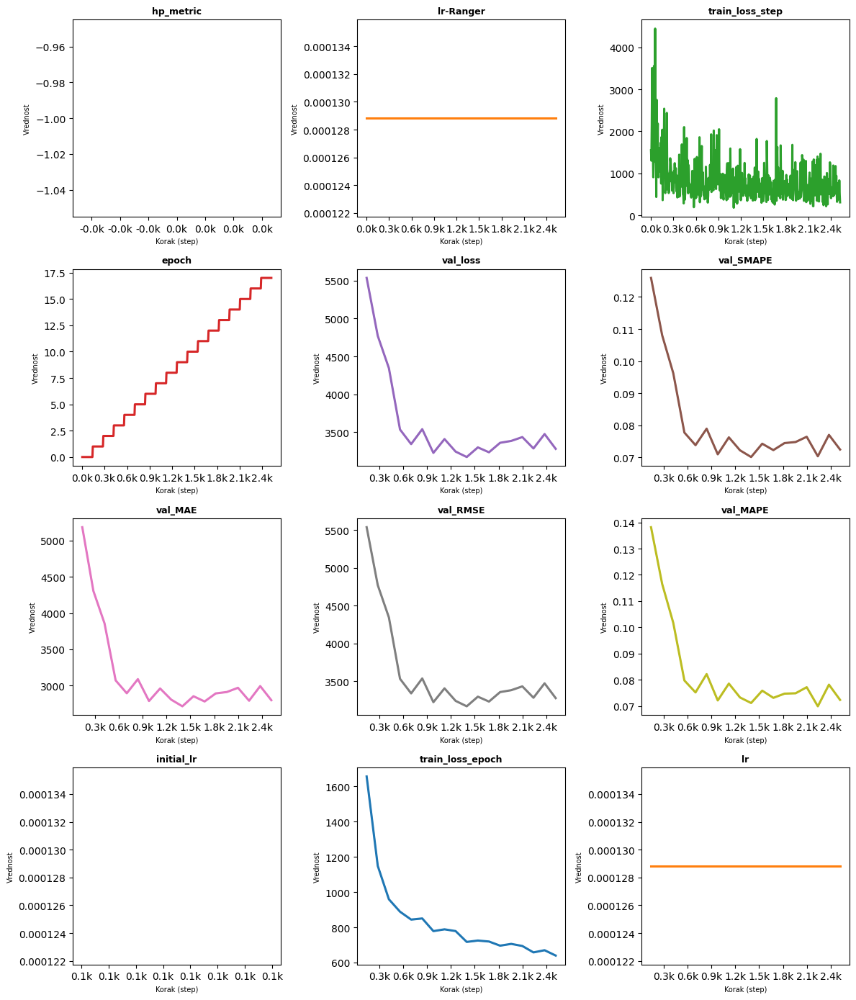

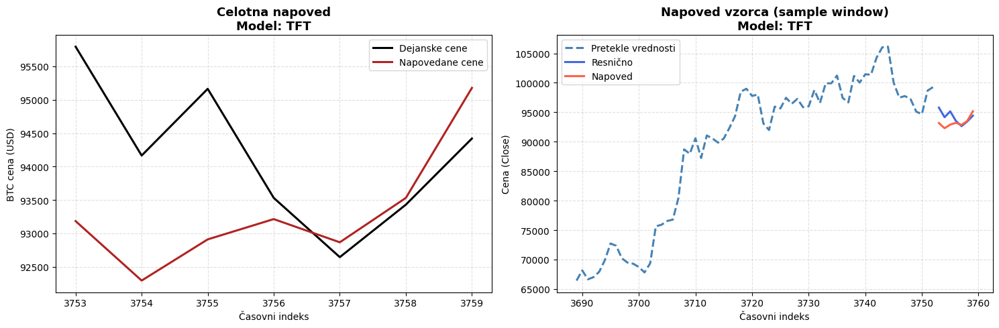

###############################
MAE:   1162.69
RMSE:  1519.01
MASE:  1.01
MAPE:  1.23
SMAPE: 1.24
AIC:   2365934.50
BIC:   2301950.81
Training time (sec): 741.15 sec
Training time: (min) 12.35 min
###############################


In [ ]:
params = {'learning_rate': 0.0005471455666945531, 'hidden_size': 124,
          'attention_head_size': 3, 'dropout': 0.46165959172098064, 'hidden_continuous_size': 42, 'beta1': 0.909700956098102, 'beta2': 0.924161092052826, 'gradient_clip_val': 0.703314793858744, 'weight_decay': 5.466172639886786e-10, 'alpha': 0.6841777084052416, 'k': 6, 'lr_factor': 0.5759419431590466}

model = train_tft(
        training=training,
        train_dataloader=train_dataloader,
        val_dataloader=val_dataloader,
        test_dataloader=test_dataloader,
        predict_dataloader=predict_dataloader,
        version="1",
        learning_rate=0.00012882495516931342,#params["learning_rate"],
        hidden_size=params["hidden_size"],
        attention_head_size=params["attention_head_size"],
        dropout=params["dropout"],
        hidden_continuous_size=params["hidden_continuous_size"],
        beta1=params["beta1"],
        beta2=params["beta2"],
        gradient_clip_val=params["gradient_clip_val"],
        weight_decay=params["weight_decay"],
        alpha=params["alpha"],
        k=params["k"],
        lr_factor=params["lr_factor"],
        lr_patience=lr_patience,
        early_stop_min_delta=early_stop_min_delta,
        early_stop_patience=early_stop_patience,
        plot=True,
        trial=None,
        max_epoch=500,
        find_lr=(1==12),
)

INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42
INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: 
   | Name                               | Type                            | Params | Mode 
------------------------------------------------------------------------------------------------
0  | loss                               | RMSE                            | 0      | train
1  | logging_metrics                    | ModuleList                      | 0      | train
2  | input_embeddings                   

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric val_loss improved. New best score: 5537.100
INFO:lightning.pytorch.callbacks.early_stopping:Metric val_loss improved. New best score: 5537.100


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric val_loss improved by 766.173 >= min_delta = 5. New best score: 4770.926
INFO:lightning.pytorch.callbacks.early_stopping:Metric val_loss improved by 766.173 >= min_delta = 5. New best score: 4770.926


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric val_loss improved by 425.807 >= min_delta = 5. New best score: 4345.120
INFO:lightning.pytorch.callbacks.early_stopping:Metric val_loss improved by 425.807 >= min_delta = 5. New best score: 4345.120


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric val_loss improved by 810.500 >= min_delta = 5. New best score: 3534.620
INFO:lightning.pytorch.callbacks.early_stopping:Metric val_loss improved by 810.500 >= min_delta = 5. New best score: 3534.620


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric val_loss improved by 193.210 >= min_delta = 5. New best score: 3341.409
INFO:lightning.pytorch.callbacks.early_stopping:Metric val_loss improved by 193.210 >= min_delta = 5. New best score: 3341.409


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric val_loss improved by 115.665 >= min_delta = 5. New best score: 3225.744
INFO:lightning.pytorch.callbacks.early_stopping:Metric val_loss improved by 115.665 >= min_delta = 5. New best score: 3225.744


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric val_loss improved by 54.725 >= min_delta = 5. New best score: 3171.019
INFO:lightning.pytorch.callbacks.early_stopping:Metric val_loss improved by 54.725 >= min_delta = 5. New best score: 3171.019


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Monitored metric val_loss did not improve in the last 8 records. Best score: 3171.019. Signaling Trainer to stop.
INFO:lightning.pytorch.callbacks.early_stopping:Monitored metric val_loss did not improve in the last 8 records. Best score: 3171.019. Signaling Trainer to stop.


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test_MAE          │      4190.0087890625      │
│         test_MAPE         │    0.04363969340920448    │
│         test_RMSE         │      5303.763671875       │
│        test_SMAPE         │    0.04520084336400032    │
│         test_loss         │      5303.763671875       │
└───────────────────────────┴───────────────────────────┘

INFO: Using default `ModelCheckpoint`. Consider installing `litmodels` package to enable `LitModelCheckpoint` for automatic upload to the Lightning model registry.
INFO:lightning.pytorch.utilities.rank_zero:Using default `ModelCheckpoint`. Consider installing `litmodels` package to enable `LitModelCheckpoint` for automatic upload to the Lightning model registry.
INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Model shranjen na: /content/drive/My Drive/Magisterij_Bucar/Modeli/tft_v1.ckpt


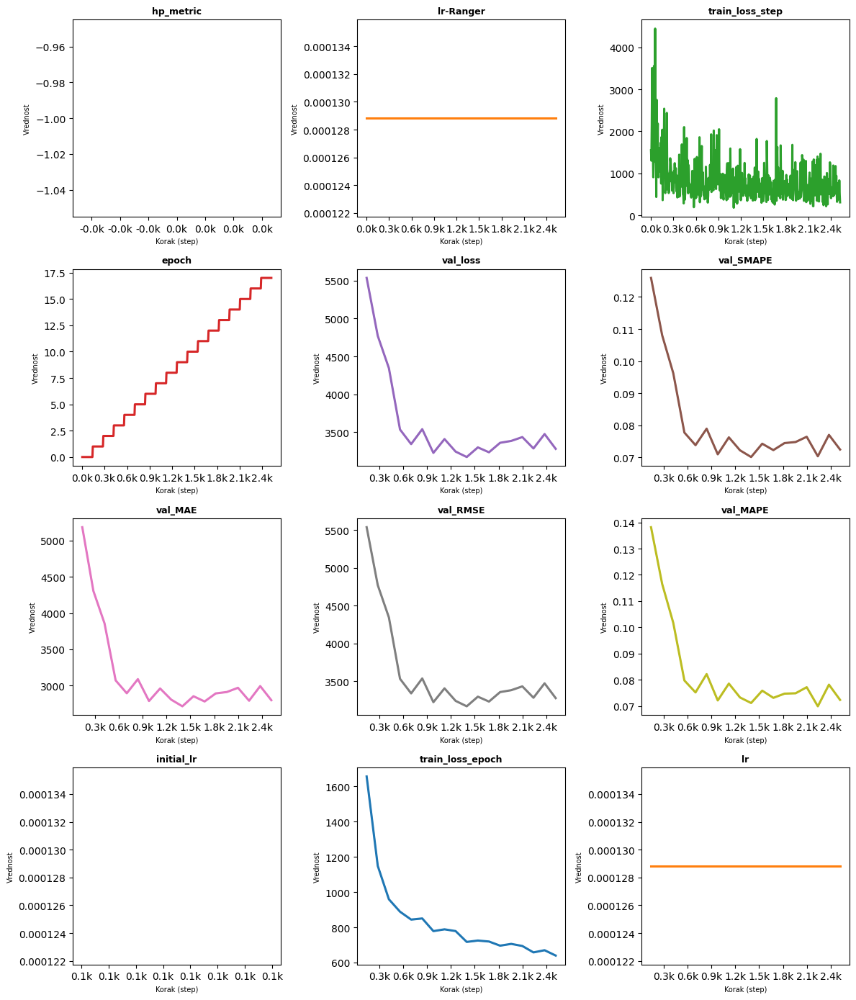

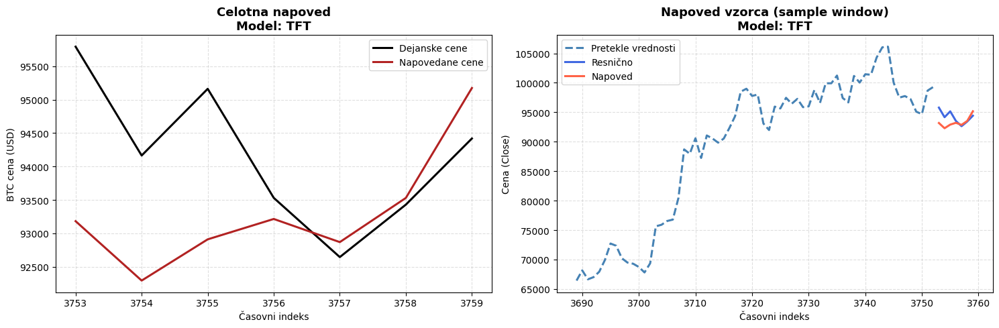

###############################
MAE:   1162.84
RMSE:  1519.46
MASE:  1.01
MAPE:  1.23
SMAPE: 1.24
AIC:   2365934.50
BIC:   2301950.82
Training time (sec): 762.22 sec
Training time: (min) 12.70 min
###############################


In [ ]:
params = {'learning_rate': 0.0005471455666945531, 'hidden_size': 124,
          'attention_head_size': 3, 'dropout': 0.46165959172098064, 'hidden_continuous_size': 42, 'beta1': 0.909700956098102, 'beta2': 0.924161092052826, 'gradient_clip_val': 0.703314793858744, 'weight_decay': 5.466172639886786e-10, 'alpha': 0.6841777084052416, 'k': 6, 'lr_factor': 0.5759419431590466}

model = train_tft(
        training=training,
        train_dataloader=train_dataloader,
        val_dataloader=val_dataloader,
        test_dataloader=test_dataloader,
        predict_dataloader=predict_dataloader,
        version="1",
        learning_rate=0.00012882495516931342,#params["learning_rate"],
        hidden_size=params["hidden_size"],
        attention_head_size=params["attention_head_size"],
        dropout=params["dropout"],
        hidden_continuous_size=params["hidden_continuous_size"],
        beta1=params["beta1"],
        beta2=params["beta2"],
        gradient_clip_val=params["gradient_clip_val"],
        weight_decay=params["weight_decay"],
        alpha=params["alpha"],
        k=params["k"],
        lr_factor=params["lr_factor"],
        lr_patience=lr_patience,
        early_stop_min_delta=early_stop_min_delta,
        early_stop_patience=early_stop_patience,
        plot=True,
        trial=None,
        max_epoch=500,
        find_lr=(1==12),
)

TOPPP

In [ ]:
# raw predictions are a dictionary from which all kind of information including quantiles can be extracted
raw_predictions = model.predict(
    predict_dataloader, mode="prediction", return_x=True, trainer_kwargs=dict(accelerator="cpu")
)

INFO: Using default `ModelCheckpoint`. Consider installing `litmodels` package to enable `LitModelCheckpoint` for automatic upload to the Lightning model registry.
INFO:lightning.pytorch.utilities.rank_zero:Using default `ModelCheckpoint`. Consider installing `litmodels` package to enable `LitModelCheckpoint` for automatic upload to the Lightning model registry.
INFO: GPU available: True (cuda), used: False
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: False
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs


INFO: Using default `ModelCheckpoint`. Consider installing `litmodels` package to enable `LitModelCheckpoint` for automatic upload to the Lightning model registry.
INFO:lightning.pytorch.utilities.rank_zero:Using default `ModelCheckpoint`. Consider installing `litmodels` package to enable `LitModelCheckpoint` for automatic upload to the Lightning model registry.
INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


{'attention': <Figure size 640x480 with 1 Axes>,
 'static_variables': <Figure size 700x300 with 1 Axes>,
 'encoder_variables': <Figure size 700x850 with 1 Axes>,
 'decoder_variables': <Figure size 700x775 with 1 Axes>}

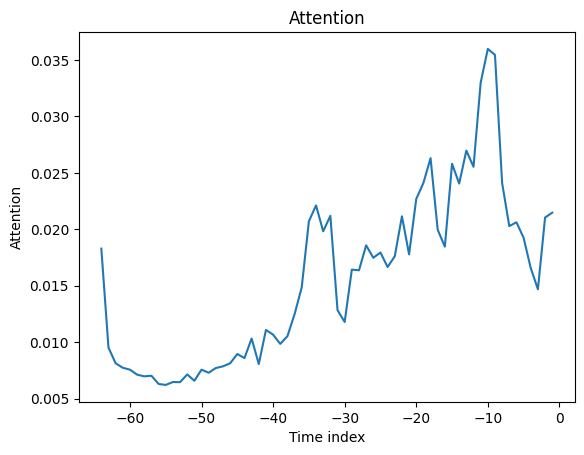

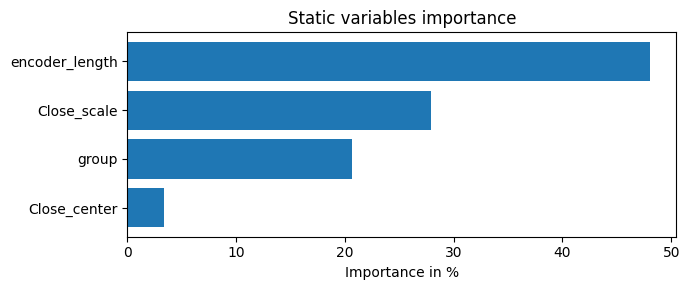

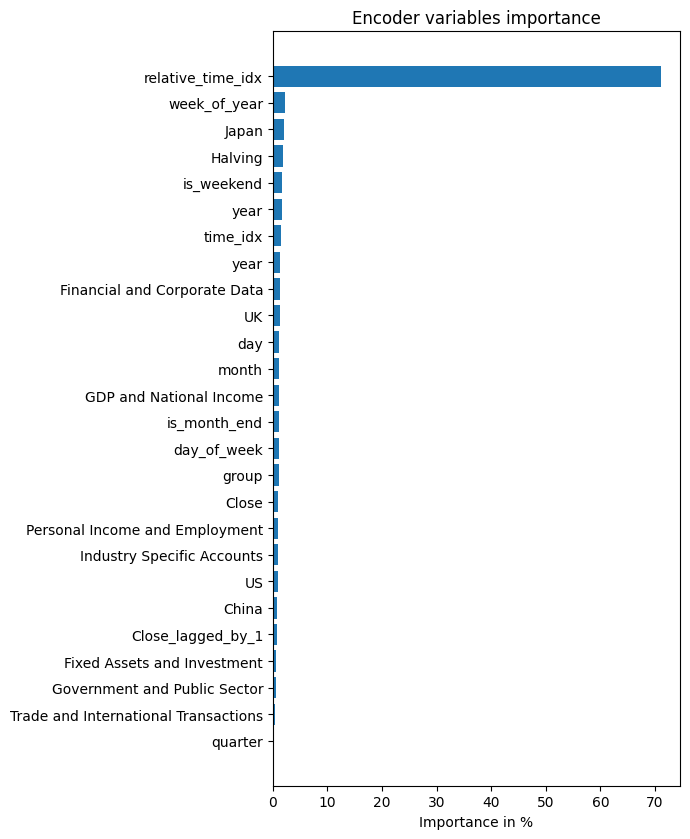

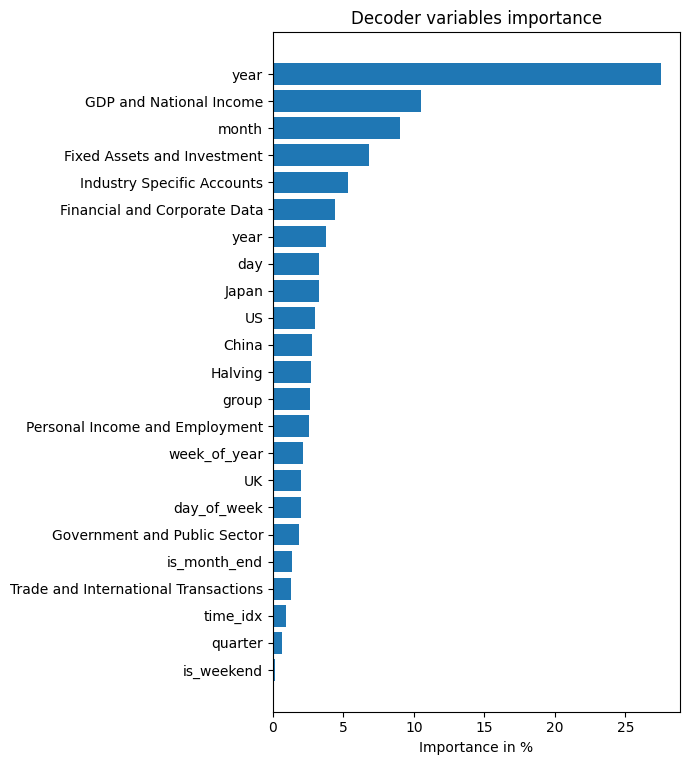

In [ ]:
raw_predictions = model.predict(predict_dataloader, return_x=True, mode="raw")
interpretation = model.interpret_output(raw_predictions.output, reduction="sum")
model.plot_interpretation(interpretation)

## Optuna search - TFT

In [ ]:
def objective(trial):
    params = {
        "version": f"optuna_{trial.number}",
        "learning_rate": trial.suggest_float("learning_rate", 1e-4, 1e-3, log=True),
        "hidden_size": trial.suggest_int("hidden_size", 16, 128),
        "attention_head_size": trial.suggest_int("attention_head_size", 1, 4),
        "dropout": trial.suggest_float("dropout", 0.25, 0.5),
        "hidden_continuous_size": trial.suggest_int("hidden_continuous_size", 16, 128),
        "beta1": trial.suggest_float("beta1", 0.9, 0.93),
        "beta2": trial.suggest_float("beta2", 0.91, 0.96),
        "gradient_clip_val": trial.suggest_float("gradient_clip_val", 0.1, 1.0),
        "weight_decay": trial.suggest_float("weight_decay", 1e-11, 1e-9, log=True),
        "alpha": trial.suggest_float("alpha", 0.68, 0.7),
        "k": trial.suggest_int("k", 6, 7),
        "lr_factor": trial.suggest_float("lr_factor", 0.3, 0.6),
        "lr_patience": 4,
        "min_lr": 1e-9,
        "plot": False,
        "trial": trial,
        "max_epoch": 50,
        "find_lr": False,
        "early_stop_patience": 8,
        "early_stop_min_delta": 1e-4,
    }

    model = train_tft(  training=training,
                        train_dataloader=train_dataloader,
                        val_dataloader=val_dataloader,
                        test_dataloader=test_dataloader,
                        predict_dataloader=predict_dataloader,
                        **params
                        )
    return model.val_loss if hasattr(model, "val_loss") else float("inf")

sampler = optuna.samplers.TPESampler(multivariate=True, seed=42)
pruner = optuna.pruners.MedianPruner(n_startup_trials=5, n_warmup_steps=3)

study = optuna.create_study(direction="minimize", sampler=sampler, pruner=pruner)
study.optimize(objective, n_trials=30)

# Najboljši rezultati
print("Najboljši parametri:", study.best_trial.params)
print("Najboljši rmse:", study.best_value)

[I 2025-05-06 07:34:49,392] A new study created in memory with name: no-name-1e7af97c-11e9-4dc0-9523-1f43f15270a8
INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42


######################
Train size: 2321
Validation size: 1364
Test size: 75
######################


INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

[I 2025-05-06 07:41:45,338] Trial 0 finished with value: 3275.4794921875 and parameters: {'learning_rate': 0.00023688639503640813, 'hidden_size': 123, 'attention_head_size': 3, 'dropout': 0.39966462104925915, 'hidden_continuous_size': 33, 'beta1': 0.9046798356100861, 'beta2': 0.91290418060841, 'gradient_clip_val': 0.8795585311974417, 'weight_decay': 1.5930522616241013e-10, 'alpha': 0.6941614515559209, 'k': 6, 'lr_factor': 0.5909729556485983}. Best is trial 0 with value: 3275.4794921875.
INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42


######################
Train size: 2321
Validation size: 1364
Test size: 75
######################


INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

[I 2025-05-06 07:48:11,367] Trial 1 finished with value: 3324.768310546875 and parameters: {'learning_rate': 0.0006798962421591129, 'hidden_size': 39, 'attention_head_size': 1, 'dropout': 0.29585112746335845, 'hidden_continuous_size': 50, 'beta1': 0.9157426929489672, 'beta2': 0.9315972509321058, 'gradient_clip_val': 0.36210622617823773, 'weight_decay': 1.6738085788752113e-10, 'alpha': 0.6827898772130409, 'k': 6, 'lr_factor': 0.40990855298810747}. Best is trial 0 with value: 3275.4794921875.
INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42


######################
Train size: 2321
Validation size: 1364
Test size: 75
######################


INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

[I 2025-05-06 08:05:39,827] Trial 2 finished with value: 3952.62744140625 and parameters: {'learning_rate': 0.0002858051065806936, 'hidden_size': 104, 'attention_head_size': 1, 'dropout': 0.37855860960340293, 'hidden_continuous_size': 82, 'beta1': 0.9013935123815999, 'beta2': 0.9403772425950719, 'gradient_clip_val': 0.2534717113185624, 'weight_decay': 1.3492834268013239e-11, 'alpha': 0.6989777107450666, 'k': 7, 'lr_factor': 0.5425192044349383}. Best is trial 0 with value: 3275.4794921875.
INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42


######################
Train size: 2321
Validation size: 1364
Test size: 75
######################


INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

[I 2025-05-06 08:13:23,130] Trial 3 finished with value: 4028.507080078125 and parameters: {'learning_rate': 0.00020165721691808595, 'hidden_size': 27, 'attention_head_size': 3, 'dropout': 0.3600381234349003, 'hidden_continuous_size': 29, 'beta1': 0.9148553073033382, 'beta2': 0.911719426055761, 'gradient_clip_val': 0.9183883618709039, 'weight_decay': 3.2927591344236144e-11, 'alpha': 0.6932504456870796, 'k': 6, 'lr_factor': 0.45602040635334323}. Best is trial 0 with value: 3275.4794921875.
INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42


######################
Train size: 2321
Validation size: 1364
Test size: 75
######################


INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

[I 2025-05-06 08:20:07,535] Trial 4 finished with value: 3911.23876953125 and parameters: {'learning_rate': 0.0003521358805467869, 'hidden_size': 36, 'attention_head_size': 4, 'dropout': 0.44378320584027864, 'hidden_continuous_size': 122, 'beta1': 0.9268448205128295, 'beta2': 0.9398949989405543, 'gradient_clip_val': 0.9296868115208051, 'weight_decay': 1.5030900645056785e-11, 'alpha': 0.6839196572483829, 'k': 6, 'lr_factor': 0.3975990992289793}. Best is trial 0 with value: 3275.4794921875.
INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42


######################
Train size: 2321
Validation size: 1364
Test size: 75
######################


INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

[I 2025-05-06 08:22:25,102] Trial 5 pruned. Trial was pruned at epoch 3.
INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42


######################
Train size: 2321
Validation size: 1364
Test size: 75
######################


INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

[I 2025-05-06 08:24:24,964] Trial 6 pruned. Trial was pruned at epoch 3.
INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42


######################
Train size: 2321
Validation size: 1364
Test size: 75
######################


INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

[I 2025-05-06 08:26:22,719] Trial 7 pruned. Trial was pruned at epoch 3.
INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42


######################
Train size: 2321
Validation size: 1364
Test size: 75
######################


INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

[I 2025-05-06 08:28:16,334] Trial 8 pruned. Trial was pruned at epoch 3.
INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42


######################
Train size: 2321
Validation size: 1364
Test size: 75
######################


INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

[I 2025-05-06 08:30:10,462] Trial 9 pruned. Trial was pruned at epoch 3.
INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42


######################
Train size: 2321
Validation size: 1364
Test size: 75
######################


INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

[I 2025-05-06 08:33:19,150] Trial 10 pruned. Trial was pruned at epoch 3.
INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42


######################
Train size: 2321
Validation size: 1364
Test size: 75
######################


INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

[I 2025-05-06 08:35:21,631] Trial 11 pruned. Trial was pruned at epoch 3.
INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42


######################
Train size: 2321
Validation size: 1364
Test size: 75
######################


INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

[I 2025-05-06 08:41:31,411] Trial 12 finished with value: 3302.86376953125 and parameters: {'learning_rate': 0.0006045521448422488, 'hidden_size': 40, 'attention_head_size': 1, 'dropout': 0.3846638843025677, 'hidden_continuous_size': 61, 'beta1': 0.9171052931985219, 'beta2': 0.9216698488989764, 'gradient_clip_val': 0.5869599511245216, 'weight_decay': 1.20984124735188e-10, 'alpha': 0.6846218265469645, 'k': 6, 'lr_factor': 0.3696783933569141}. Best is trial 0 with value: 3275.4794921875.
INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42


######################
Train size: 2321
Validation size: 1364
Test size: 75
######################


INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

[I 2025-05-06 08:47:27,520] Trial 13 finished with value: 3645.48095703125 and parameters: {'learning_rate': 0.0005528567748686543, 'hidden_size': 47, 'attention_head_size': 1, 'dropout': 0.40259852303043775, 'hidden_continuous_size': 81, 'beta1': 0.92912926365241, 'beta2': 0.9300523539824429, 'gradient_clip_val': 0.8218751407299616, 'weight_decay': 6.102368143941924e-11, 'alpha': 0.684588954450636, 'k': 6, 'lr_factor': 0.35885029577237776}. Best is trial 0 with value: 3275.4794921875.
INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42


######################
Train size: 2321
Validation size: 1364
Test size: 75
######################


INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

[I 2025-05-06 08:49:27,298] Trial 14 pruned. Trial was pruned at epoch 3.
INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42


######################
Train size: 2321
Validation size: 1364
Test size: 75
######################


INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

[I 2025-05-06 08:58:41,321] Trial 15 finished with value: 2864.796630859375 and parameters: {'learning_rate': 0.00018736892664054258, 'hidden_size': 120, 'attention_head_size': 3, 'dropout': 0.4477945309602307, 'hidden_continuous_size': 50, 'beta1': 0.9035168793674491, 'beta2': 0.9184993510250603, 'gradient_clip_val': 0.6485223130033032, 'weight_decay': 3.762555351807825e-10, 'alpha': 0.6923234537484068, 'k': 7, 'lr_factor': 0.596738457922626}. Best is trial 15 with value: 2864.796630859375.
INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42


######################
Train size: 2321
Validation size: 1364
Test size: 75
######################


INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

[I 2025-05-06 09:01:18,569] Trial 16 pruned. Trial was pruned at epoch 3.
INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42


######################
Train size: 2321
Validation size: 1364
Test size: 75
######################


INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

[I 2025-05-06 09:03:24,498] Trial 17 pruned. Trial was pruned at epoch 3.
INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42


######################
Train size: 2321
Validation size: 1364
Test size: 75
######################


INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

[I 2025-05-06 09:05:30,388] Trial 18 pruned. Trial was pruned at epoch 3.
INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42


######################
Train size: 2321
Validation size: 1364
Test size: 75
######################


INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

[I 2025-05-06 09:11:31,539] Trial 19 finished with value: 2997.658447265625 and parameters: {'learning_rate': 0.000655135237147565, 'hidden_size': 120, 'attention_head_size': 3, 'dropout': 0.3973753378274431, 'hidden_continuous_size': 69, 'beta1': 0.9006140308601344, 'beta2': 0.913393548257133, 'gradient_clip_val': 0.6094345337385123, 'weight_decay': 4.777469598027627e-10, 'alpha': 0.6901803995212439, 'k': 6, 'lr_factor': 0.5956123070365692}. Best is trial 15 with value: 2864.796630859375.
INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42


######################
Train size: 2321
Validation size: 1364
Test size: 75
######################


INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

[I 2025-05-06 09:17:01,384] Trial 20 finished with value: 3400.38818359375 and parameters: {'learning_rate': 0.0004712118143941337, 'hidden_size': 85, 'attention_head_size': 4, 'dropout': 0.34507475842832563, 'hidden_continuous_size': 60, 'beta1': 0.9018003624134596, 'beta2': 0.914216801716222, 'gradient_clip_val': 0.5830591971253148, 'weight_decay': 7.201433592743539e-10, 'alpha': 0.6829644439092204, 'k': 6, 'lr_factor': 0.5749670114724948}. Best is trial 15 with value: 2864.796630859375.
INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42


######################
Train size: 2321
Validation size: 1364
Test size: 75
######################


INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

[I 2025-05-06 09:20:03,147] Trial 21 pruned. Trial was pruned at epoch 3.
INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42


######################
Train size: 2321
Validation size: 1364
Test size: 75
######################


INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

[I 2025-05-06 09:23:16,784] Trial 22 pruned. Trial was pruned at epoch 5.
INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42


######################
Train size: 2321
Validation size: 1364
Test size: 75
######################


INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

[I 2025-05-06 09:29:27,570] Trial 23 finished with value: 2924.7587890625 and parameters: {'learning_rate': 0.0004858284412205615, 'hidden_size': 111, 'attention_head_size': 3, 'dropout': 0.4200017501381043, 'hidden_continuous_size': 25, 'beta1': 0.908060718511618, 'beta2': 0.9262240656551234, 'gradient_clip_val': 0.8140988352336783, 'weight_decay': 2.097411454310355e-10, 'alpha': 0.6877974061949531, 'k': 6, 'lr_factor': 0.5958065495242917}. Best is trial 15 with value: 2864.796630859375.
INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42


######################
Train size: 2321
Validation size: 1364
Test size: 75
######################


INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

[I 2025-05-06 09:31:30,407] Trial 24 pruned. Trial was pruned at epoch 3.
INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42


######################
Train size: 2321
Validation size: 1364
Test size: 75
######################


INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

[I 2025-05-06 09:38:32,076] Trial 25 finished with value: 3194.035400390625 and parameters: {'learning_rate': 0.0007930844382751358, 'hidden_size': 64, 'attention_head_size': 2, 'dropout': 0.47388437365845354, 'hidden_continuous_size': 28, 'beta1': 0.9117845233308162, 'beta2': 0.9139273316125308, 'gradient_clip_val': 0.9731102506112747, 'weight_decay': 2.2278546090621072e-10, 'alpha': 0.6863786149586976, 'k': 6, 'lr_factor': 0.5622613188721293}. Best is trial 15 with value: 2864.796630859375.
INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42


######################
Train size: 2321
Validation size: 1364
Test size: 75
######################


INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

[I 2025-05-06 09:46:57,772] Trial 26 finished with value: 3015.10595703125 and parameters: {'learning_rate': 0.0009012576259827061, 'hidden_size': 114, 'attention_head_size': 3, 'dropout': 0.41833405242545446, 'hidden_continuous_size': 61, 'beta1': 0.9050493885998717, 'beta2': 0.9157130989354947, 'gradient_clip_val': 0.6958387087638795, 'weight_decay': 3.521623477802435e-11, 'alpha': 0.686734232403779, 'k': 7, 'lr_factor': 0.5253309402742639}. Best is trial 15 with value: 2864.796630859375.
INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42


######################
Train size: 2321
Validation size: 1364
Test size: 75
######################


INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

[I 2025-05-06 09:54:17,462] Trial 27 finished with value: 2690.65087890625 and parameters: {'learning_rate': 0.0005471455666945531, 'hidden_size': 124, 'attention_head_size': 3, 'dropout': 0.46165959172098064, 'hidden_continuous_size': 42, 'beta1': 0.909700956098102, 'beta2': 0.924161092052826, 'gradient_clip_val': 0.703314793858744, 'weight_decay': 5.466172639886786e-10, 'alpha': 0.6841777084052416, 'k': 6, 'lr_factor': 0.5759419431590466}. Best is trial 27 with value: 2690.65087890625.
INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42


######################
Train size: 2321
Validation size: 1364
Test size: 75
######################


INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

[I 2025-05-06 09:56:23,404] Trial 28 pruned. Trial was pruned at epoch 3.
INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42


######################
Train size: 2321
Validation size: 1364
Test size: 75
######################


INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

[I 2025-05-06 10:02:01,907] Trial 29 finished with value: 2959.79345703125 and parameters: {'learning_rate': 0.0005201416823221171, 'hidden_size': 107, 'attention_head_size': 3, 'dropout': 0.4049385719953703, 'hidden_continuous_size': 23, 'beta1': 0.9204722646670528, 'beta2': 0.9323036228660214, 'gradient_clip_val': 0.6669145358379176, 'weight_decay': 3.855427089795773e-10, 'alpha': 0.6877628277313769, 'k': 6, 'lr_factor': 0.49576947180714054}. Best is trial 27 with value: 2690.65087890625.


Najboljši parametri: {'learning_rate': 0.0005471455666945531, 'hidden_size': 124, 'attention_head_size': 3, 'dropout': 0.46165959172098064, 'hidden_continuous_size': 42, 'beta1': 0.909700956098102, 'beta2': 0.924161092052826, 'gradient_clip_val': 0.703314793858744, 'weight_decay': 5.466172639886786e-10, 'alpha': 0.6841777084052416, 'k': 6, 'lr_factor': 0.5759419431590466}
Najboljši rmse: 2690.65087890625


In [ ]:
print("Best parameters:", study.best_params)
vis.plot_optimization_history(study).show()
vis.plot_param_importances(study).show()
vis.plot_parallel_coordinate(study).show()
vis.plot_contour(study).show()
vis.plot_slice(study).show()
vis.plot_edf(study).show()

Best parameters: {'learning_rate': 0.0005471455666945531, 'hidden_size': 124, 'attention_head_size': 3, 'dropout': 0.46165959172098064, 'hidden_continuous_size': 42, 'beta1': 0.909700956098102, 'beta2': 0.924161092052826, 'gradient_clip_val': 0.703314793858744, 'weight_decay': 5.466172639886786e-10, 'alpha': 0.6841777084052416, 'k': 6, 'lr_factor': 0.5759419431590466}


# Evaluacija modelov

In [ ]:
def evaluate_model(model_name, model_cls, model_path, predict_dataloader):
    import warnings
    warnings.filterwarnings("ignore")

    # === Load model izključno na CPU ===
    model = model_cls.load_from_checkpoint(model_path, map_location=torch.device("cpu"))
    model.eval()

    # === Preverjanje indeksov v decoder_cat ===
    try:
        sample_batch = next(iter(predict_dataloader))
        if "decoder_cat" in sample_batch:
            cat_data = sample_batch["decoder_cat"]
            max_vals = cat_data.max(dim=1).values.cpu().numpy()
            print(f"[{model_name}] Max decoder_cat po kategorijah: {max_vals}")
    except Exception as e:
        print(f"[{model_name}] Opozorilo pri preverjanju decoder_cat: {e}")

    # === Napoved (TFT vs. LSTM/GRU) ===
    try:
        if hasattr(model, "output_size") and model.output_size == 1:
            # LSTM/GRU
            raw_output = model.predict(predict_dataloader, mode="prediction", return_x=True, batch_size=1000)
            preds = raw_output.output
        else:
            # TFT
            raw_output = model.predict(predict_dataloader, mode="raw", return_x=True)
            preds = raw_output.output.prediction
    except RuntimeError as e:
        print(f"[{model_name}] Napaka med .predict(): {e}")
        raise RuntimeError(f"Napaka pri evalvaciji modela {model_name}")

    x = raw_output.x
    decoded_preds = []
    decoded_actuals = []
    decoded_times = []

    for i in range(len(preds)):
        p = preds[i]
        if p.ndim == 2:  # TFT
            y_pred = p[:, 0].detach().cpu().numpy()
        elif p.ndim == 1:  # LSTM/GRU
            y_pred = p.detach().cpu().numpy()
        else:
            raise ValueError(f"Nepodprta oblika preds[{i}]: shape {p.shape}")

        y_true = x["decoder_target"][i].detach().cpu().numpy()
        time_idx = x["decoder_time_idx"][i].detach().cpu().numpy()

        decoded_preds.append(y_pred)
        decoded_actuals.append(y_true)
        decoded_times.append(time_idx)

    df_plot = pd.DataFrame({
        "time_idx": np.concatenate(decoded_times),
        "y_pred": np.concatenate(decoded_preds),
        "y_true": np.concatenate(decoded_actuals),
        "model": model_name.upper()
    })

    # === METRIKE ===
    mae = mean_absolute_error(df_plot["y_true"], df_plot["y_pred"])
    rmse = np.sqrt(mean_squared_error(df_plot["y_true"], df_plot["y_pred"]))
    mase = mae / np.mean(np.abs(df_plot["y_true"].diff().dropna()))
    mape = np.mean(np.abs((df_plot["y_true"] - df_plot["y_pred"]) / df_plot["y_true"])) * 100
    numerator = np.abs(df_plot["y_pred"] - df_plot["y_true"])
    denominator = (np.abs(df_plot["y_true"]) + np.abs(df_plot["y_pred"])) / 2
    smape = np.mean(numerator / denominator) * 100
    n = len(df_plot)
    rss = np.sum((df_plot["y_true"] - df_plot["y_pred"]) ** 2)
    k_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
    aic = n * np.log(rss / n) + 2 * k_params
    bic = n * np.log(rss / n) + k_params * np.log(n)
    training_time = getattr(model, "training_time", np.nan)

    print("###############################")
    print(f"MAE:   {mae:.2f}")
    print(f"RMSE:  {rmse:.2f}")
    print(f"MASE:  {mase:.2f}")
    print(f"MAPE:  {mape:.2f}")
    print(f"SMAPE: {smape:.2f}")
    print(f"AIC:   {aic:.2f}")
    print(f"BIC:   {bic:.2f}")
    print("###############################")

    metrics = {
        "Model": model_name.upper().split("_")[0],
        "MAE": mae,
        "RMSE": rmse,
        "MASE": mase,
        "MAPE": mape,
        "SMAPE": smape,
        "AIC": aic,
        "BIC": bic,
    }

    return df_plot, metrics




INFO: Using default `ModelCheckpoint`. Consider installing `litmodels` package to enable `LitModelCheckpoint` for automatic upload to the Lightning model registry.
INFO:lightning.pytorch.utilities.rank_zero:Using default `ModelCheckpoint`. Consider installing `litmodels` package to enable `LitModelCheckpoint` for automatic upload to the Lightning model registry.
INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


###############################
MAE:   6255.51
RMSE:  6513.93
MASE:  5.42
MAPE:  6.66
SMAPE: 6.43
AIC:   461128.94
BIC:   448661.07
###############################


INFO: Using default `ModelCheckpoint`. Consider installing `litmodels` package to enable `LitModelCheckpoint` for automatic upload to the Lightning model registry.
INFO:lightning.pytorch.utilities.rank_zero:Using default `ModelCheckpoint`. Consider installing `litmodels` package to enable `LitModelCheckpoint` for automatic upload to the Lightning model registry.
INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


###############################
MAE:   6327.27
RMSE:  6535.32
MASE:  5.48
MAPE:  6.74
SMAPE: 6.50
AIC:   725855.00
BIC:   706227.62
###############################


INFO: Using default `ModelCheckpoint`. Consider installing `litmodels` package to enable `LitModelCheckpoint` for automatic upload to the Lightning model registry.
INFO:lightning.pytorch.utilities.rank_zero:Using default `ModelCheckpoint`. Consider installing `litmodels` package to enable `LitModelCheckpoint` for automatic upload to the Lightning model registry.
INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


###############################
MAE:   1162.84
RMSE:  1519.46
MASE:  1.01
MAPE:  1.23
SMAPE: 1.24
AIC:   2365934.50
BIC:   2301950.82
###############################


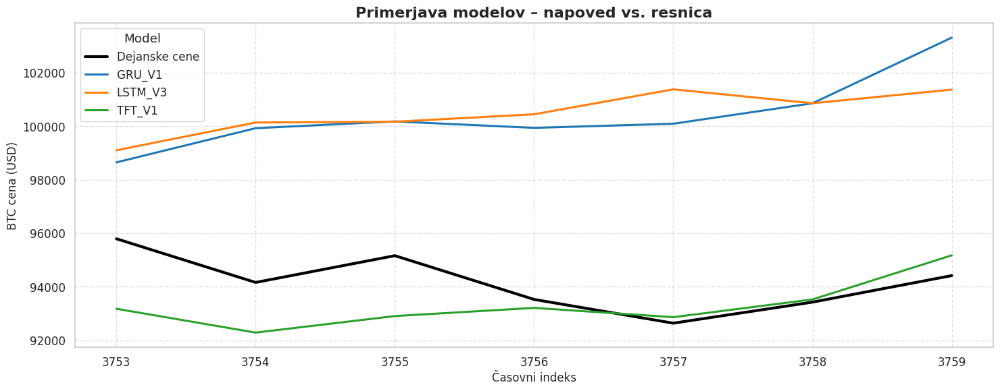

,Model,MAE,RMSE,MASE,MAPE,SMAPE,AIC,BIC,Training time (s),Model params,Model size (MB)
2,TFT,1162.84,1519.46,1.01,1.23,1.24,2.365934e+06,2301950.82,741.15,1200000,4.73
0,GRU,6255.51,6513.93,5.42,6.66,6.43,4.611289e+05,448661.07,196.37,230000,0.92
1,LSTM,6327.27,6535.32,5.48,6.74,6.50,7.258550e+05,706227.62,116.22,362000,1.45


In [ ]:

# --- Definicija modelov ---
models = {
    "gru_v1": MyRecurrentLSTM,
    "lstm_v3": MyRecurrentLSTM,
    "tft_v1": MyTFT
}

all_predictions = []
metrics_list = []

for name, cls in models.items():
    path = os.path.join(save_dir_modeli, f"{name}.ckpt")
    df_plot, metrics = evaluate_model(name, cls, path, predict_dataloader=predict_dataloader )
    all_predictions.append(df_plot)
    metrics_list.append(metrics)

# --- Skupni DataFrame ---
df_all = pd.concat(all_predictions, ignore_index=True)
df_metrics = pd.DataFrame(metrics_list)

# --- Skupni graf ---
sns.set(style="whitegrid", font_scale=1.1)
plt.figure(figsize=(15, 6))

# Resnična črta – poudarjena
sns.lineplot(
    data=df_all,
    x="time_idx",
    y="y_true",
    color="black",
    linewidth=3.0,
    label="Dejanske cene"
)

# Modeli – barvno ločeni
sns.lineplot(
    data=df_all,
    x="time_idx",
    y="y_pred",
    hue="model",
    linewidth=2.2,
    palette="tab10"
)

plt.xlabel("Časovni indeks", fontsize=12)
plt.ylabel("BTC cena (USD)", fontsize=12)
plt.title("Primerjava modelov – napoved vs. resnica", fontsize=16, fontweight="bold")
plt.grid(True, linestyle="--", alpha=0.6)
plt.legend(title="Model", frameon=True)
plt.tight_layout()
plt.savefig(os.path.join(save_dir_slike, "primerjava_modelov_full.png"), dpi=300)
plt.show()

training_times = [196.37, 116.22, 741.15]
model_size = [0.922, 1.451, 4.732]
model_params = [230000, 362000, 1200000]

# Dodaj stolpec
df_metrics["Training time (s)"] = training_times
df_metrics["Model params"] = model_params
df_metrics["Model size (MB)"] = model_size


df_metrics_rounded = df_metrics.copy()
df_metrics_rounded.iloc[:, 1:] = df_metrics_rounded.iloc[:, 1:].applymap(lambda x: np.round(x, 2))
df_metrics_rounded = df_metrics_rounded.sort_values(by="RMSE", ascending=True)
df_metrics_rounded

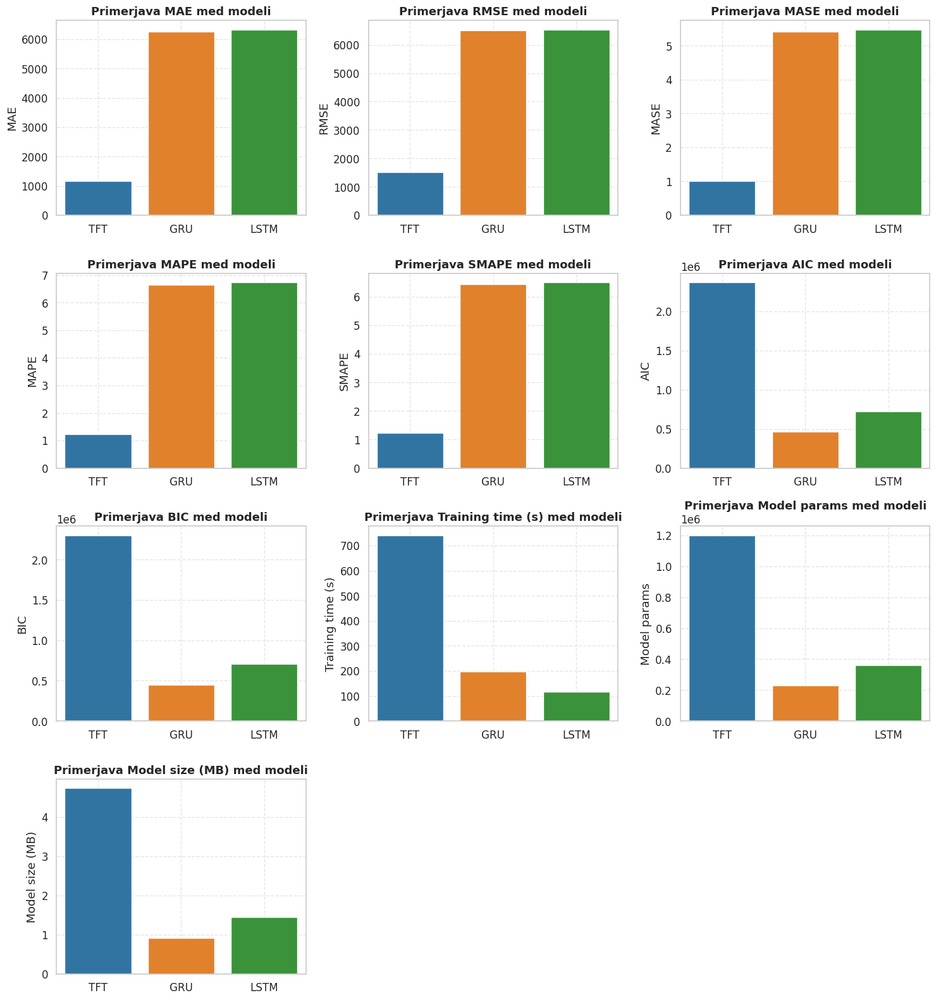

In [ ]:
df_metrics = df_metrics_rounded.copy()

# Če je "Model" indeks, ga resetiraj
if df_metrics.index.name == "Model":
    df_metrics = df_metrics.reset_index()

# Poskrbi da je "Model" tipa string
df_metrics["Model"] = df_metrics["Model"].astype(str)

# Pretvori numerične stolpce (če še niso)
numeric_cols = ["MAE", "RMSE", "MASE", "MAPE", "SMAPE", "AIC", "BIC", "Training time (s)", "Model params",	"Model size (MB)"]
df_metrics[numeric_cols] = df_metrics[numeric_cols].apply(pd.to_numeric, errors="coerce")

# Seaborn stil
sns.set(style="whitegrid", font_scale=1.1)

# Pripravimo grafe
ncols = 3
nrows = -(-len(numeric_cols) // ncols)  # ceil
fig, axs = plt.subplots(nrows, ncols, figsize=(5 * ncols, 4 * nrows))
axs = axs.flatten()

# Izriši vsak stolpčni graf
for i, metric in enumerate(numeric_cols):
    sns.barplot(data=df_metrics, x="Model", y=metric, palette="tab10", ax=axs[i])
    axs[i].set_title(f"Primerjava {metric} med modeli", fontsize=13, fontweight="bold")
    axs[i].set_xlabel("")
    axs[i].set_ylabel(metric)
    axs[i].grid(True, linestyle="--", alpha=0.5)

# Prazni grafe skrij
for j in range(i + 1, len(axs)):
    axs[j].axis("off")

# Shrani in prikaži
plt.tight_layout()
plt.savefig(os.path.join(save_dir_slike, "primerjava_metrik_modeli_vkljucno_time.png"), dpi=300)
plt.show()

INFO: Using default `ModelCheckpoint`. Consider installing `litmodels` package to enable `LitModelCheckpoint` for automatic upload to the Lightning model registry.
INFO:lightning.pytorch.utilities.rank_zero:Using default `ModelCheckpoint`. Consider installing `litmodels` package to enable `LitModelCheckpoint` for automatic upload to the Lightning model registry.
INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: Using default `ModelCheckpoint`. Consider installing `litmodels` package to enable `LitModelCheckpoint` for automatic u

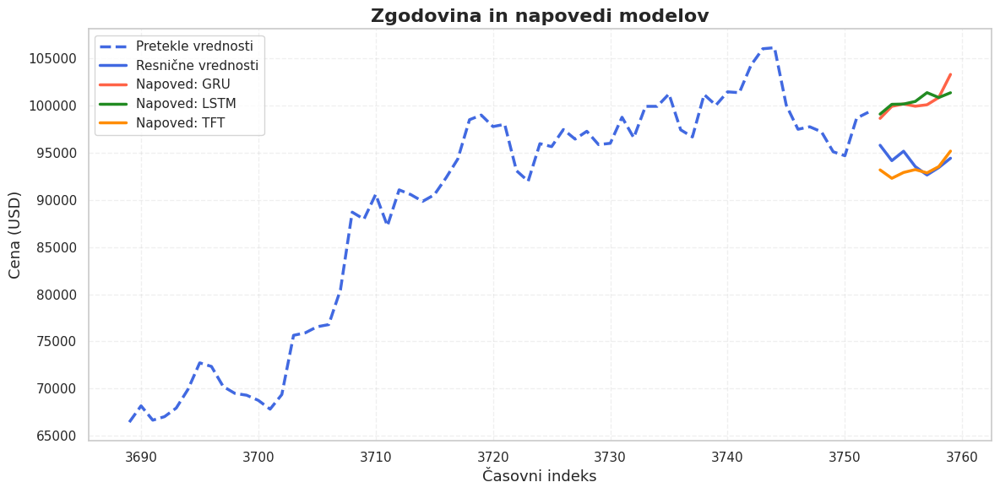

In [ ]:

# --- Vizualne nastavitve ---
sns.set(style="whitegrid")
plt.figure(figsize=(12, 6))
plt.rcParams.update({'axes.titlesize': 16, 'axes.labelsize': 13, 'legend.fontsize': 11})

# --- TFT zgodovina + resnica ---
tft_model = models["tft_v1"].load_from_checkpoint(os.path.join(save_dir_modeli, "tft_v1.ckpt"))
tft_model.eval()
tft_model.freeze()

raw_output = tft_model.predict(predict_dataloader, mode="raw", return_x=True)
x = raw_output.x
preds = raw_output.output.prediction

idx = 0
time_dec = x["decoder_time_idx"][idx].detach().cpu().numpy().reshape(-1)
y_true_sample = x["decoder_target"][idx].detach().cpu().numpy().reshape(-1)
y_pred_tft = preds[idx].detach().cpu().numpy().reshape(-1)

enc_len = x["encoder_cont"][idx].shape[0]
y_enc = x["encoder_target"][idx][:enc_len].detach().cpu().numpy().reshape(-1)
time_enc = time_dec[0] - np.arange(enc_len, 0, -1)

# --- Pretekle vrednosti (črtkano), resnično nadaljevanje (polna) ---
plt.plot(time_enc, y_enc, linestyle="--", linewidth=2.5, color="royalblue", label="Pretekle vrednosti")
plt.plot(time_dec, y_true_sample, linestyle="-", linewidth=2.5, color="royalblue", label="Resnične vrednosti")

# --- Napovedi za vse modele ---
barve = {
    "gru_v1": "tomato",
    "lstm_v3": "forestgreen",
    "tft_v1": "darkorange"
}

for name, cls in models.items():
    path = os.path.join(save_dir_modeli, f"{name}.ckpt")
    model = cls.load_from_checkpoint(path)
    model.eval()
    model.freeze()

    if "tft" in name.lower():
        y_pred_sample = y_pred_tft
    else:
        preds_rnn = model.predict(predict_dataloader)
        y_pred_sample = preds_rnn[idx].detach().cpu().numpy().reshape(-1)
    short_name = name.split("_")[0].upper()

    plt.plot(time_dec, y_pred_sample, linewidth=2.5, linestyle="-",
             label=f"Napoved: {short_name}", color=barve.get(name, None))

# --- Estetika ---
plt.xlabel("Časovni indeks")
plt.ylabel("Cena (USD)")
plt.title("Zgodovina in napovedi modelov", fontweight="bold")
plt.grid(True, linestyle="--", alpha=0.3)
plt.legend(loc="best", frameon=True)
plt.tight_layout()
plt.savefig(os.path.join(save_dir_slike, "sample_window_all_models_clean.png"), dpi=300)
plt.show()

INFO: Using default `ModelCheckpoint`. Consider installing `litmodels` package to enable `LitModelCheckpoint` for automatic upload to the Lightning model registry.
INFO:lightning.pytorch.utilities.rank_zero:Using default `ModelCheckpoint`. Consider installing `litmodels` package to enable `LitModelCheckpoint` for automatic upload to the Lightning model registry.
INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: Using default `ModelCheckpoint`. Consider installing `litmodels` package to enable `LitModelCheckpoint` for automatic u

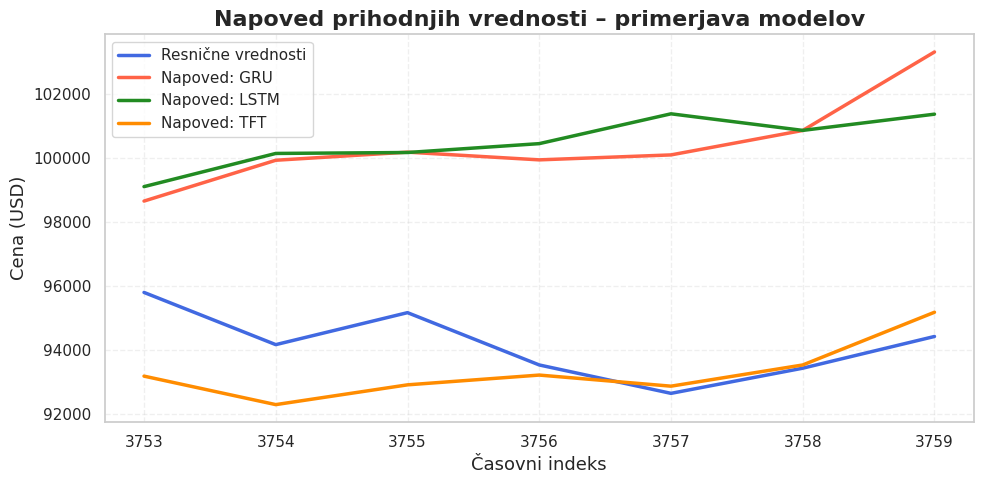

In [ ]:

sns.set(style="whitegrid")
plt.figure(figsize=(10, 5))
plt.rcParams.update({'axes.titlesize': 16, 'axes.labelsize': 13, 'legend.fontsize': 11})

# --- Pripravi TFT (za pridobitev y_true in time_dec) ---
tft_model = models["tft_v1"].load_from_checkpoint(os.path.join(save_dir_modeli, "tft_v1.ckpt"))
tft_model.eval()
tft_model.freeze()

raw_output = tft_model.predict(predict_dataloader, mode="raw", return_x=True)
x = raw_output.x
preds = raw_output.output.prediction

idx = 0
time_dec = x["decoder_time_idx"][idx].detach().cpu().numpy().reshape(-1)
y_true_sample = x["decoder_target"][idx].detach().cpu().numpy().reshape(-1)
y_pred_tft = preds[idx].detach().cpu().numpy().reshape(-1)

# --- Izriši resnične vrednosti ---
plt.plot(time_dec, y_true_sample, linestyle="-", linewidth=2.5, color="royalblue", label="Resnične vrednosti")

# --- Napovedi za vse modele ---
barve = {
    "gru_v1": "tomato",
    "lstm_v3": "forestgreen",
    "tft_v1": "darkorange"
}

for name, cls in models.items():
    path = os.path.join(save_dir_modeli, f"{name}.ckpt")
    model = cls.load_from_checkpoint(path)
    model.eval()
    model.freeze()

    if "tft" in name.lower():
        y_pred_sample = y_pred_tft
    else:
        preds_rnn = model.predict(predict_dataloader)
        y_pred_sample = preds_rnn[idx].detach().cpu().numpy().reshape(-1)

    short_name = name.split("_")[0].upper()
    plt.plot(time_dec, y_pred_sample, linewidth=2.5, linestyle="-",
             label=f"Napoved: {short_name}", color=barve.get(name, None))

# --- Estetika ---
plt.xlabel("Časovni indeks")
plt.ylabel("Cena (USD)")
plt.title("Napoved prihodnjih vrednosti – primerjava modelov", fontweight="bold")
plt.legend(loc="best", frameon=True)
plt.grid(True, linestyle="--", alpha=0.3)
plt.tight_layout()
plt.savefig(os.path.join(save_dir_slike, "sample_window_models_no_history.png"), dpi=300)
plt.show()

INFO: Using default `ModelCheckpoint`. Consider installing `litmodels` package to enable `LitModelCheckpoint` for automatic upload to the Lightning model registry.
INFO:lightning.pytorch.utilities.rank_zero:Using default `ModelCheckpoint`. Consider installing `litmodels` package to enable `LitModelCheckpoint` for automatic upload to the Lightning model registry.
INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: Using default `ModelCheckpoint`. Consider installing `litmodels` package to enable `LitModelCheckpoint` for automatic u

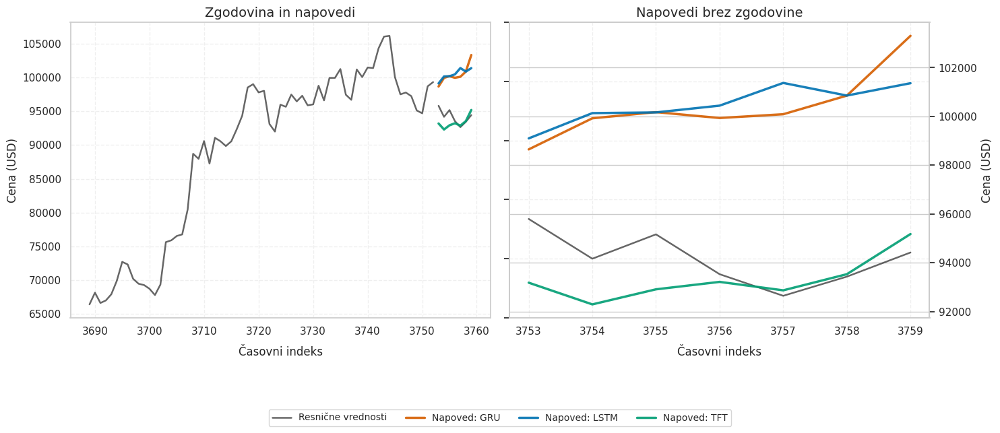

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import os

sns.set(style="whitegrid")
plt.rcParams.update({'axes.titlesize': 14, 'axes.labelsize': 12, 'legend.fontsize': 10})

# --- Barve modelov (močno kontrastne) ---
barve = {
    "gru_v1": "#D55E00",      # rdeče-oranžna
    "lstm_v3": "#0072B2",     # modra
    "tft_v1": "#009E73"       # zelena
}

# --- Naloži TFT za y_true in zgodovino ---
tft_model = models["tft_v1"].load_from_checkpoint(os.path.join(save_dir_modeli, "tft_v1.ckpt"))
tft_model.eval()
tft_model.freeze()

raw_output = tft_model.predict(predict_dataloader, mode="raw", return_x=True)
x = raw_output.x
preds = raw_output.output.prediction

idx = 0
time_dec = x["decoder_time_idx"][idx].detach().cpu().numpy().reshape(-1)
y_true_sample = x["decoder_target"][idx].detach().cpu().numpy().reshape(-1)
y_pred_tft = preds[idx].detach().cpu().numpy().reshape(-1)

enc_len = x["encoder_cont"][idx].shape[0]
y_enc = x["encoder_target"][idx][:enc_len].detach().cpu().numpy().reshape(-1)
time_enc = time_dec[0] - np.arange(enc_len, 0, -1)

# --- Zberi napovedi vseh modelov ---
model_predictions = {}
for name, cls in models.items():
    path = os.path.join(save_dir_modeli, f"{name}.ckpt")
    model = cls.load_from_checkpoint(path)
    model.eval()
    model.freeze()

    if "tft" in name.lower():
        y_pred = y_pred_tft
    else:
        preds_rnn = model.predict(predict_dataloader)
        y_pred = preds_rnn[idx].detach().cpu().numpy().reshape(-1)

    model_predictions[name] = y_pred

# --- Pripravi subplota in desno Y-os ---
fig, axs = plt.subplots(1, 2, figsize=(15, 6))
axs_right_y = axs[1].twinx()  # desna Y-os

# === Levi graf: zgodovina + napovedi ===
axs[0].plot(time_enc, y_enc, linestyle="-", linewidth=1.8, color="black", alpha=0.6, label=None)
axs[0].plot(time_dec, y_true_sample, linestyle="-", linewidth=1.8, color="black", alpha=0.6, label="Resnične vrednosti")

for name, y_pred_sample in model_predictions.items():
    short_name = name.split("_")[0].upper()
    axs[0].plot(time_dec, y_pred_sample, linewidth=2.5, linestyle="-",
                label=f"Napoved: {short_name}", color=barve.get(name, None), alpha=0.9)

axs[0].set_title("Zgodovina in napovedi")
axs[0].set_xlabel("Časovni indeks", labelpad=10)
axs[0].set_ylabel("Cena (USD)")
axs[0].grid(True, linestyle="--", alpha=0.3)

# === Desni graf: napovedi z desno Y-osjo ===
axs_right_y.plot(time_dec, y_true_sample, linestyle="-", linewidth=1.8, color="black", alpha=0.6, label="Resnične vrednosti")

for name, y_pred_sample in model_predictions.items():
    short_name = name.split("_")[0].upper()
    axs_right_y.plot(time_dec, y_pred_sample, linewidth=2.5, linestyle="-",
                     label=f"Napoved: {short_name}", color=barve.get(name, None), alpha=0.9)

axs[1].set_title("Napovedi brez zgodovine")
axs[1].set_xlabel("Časovni indeks", labelpad=10)
axs[1].tick_params(labelleft=False)
axs_right_y.set_ylabel("Cena (USD)")
axs[1].grid(True, linestyle="--", alpha=0.3)

# --- Legenda (spodaj, enotna) ---
# pobere ročno legendo iz levega grafa
handles, labels = axs[0].get_legend_handles_labels()
fig.legend(handles, labels, loc="lower center", ncol=len(labels), bbox_to_anchor=(0.5, -0.08), frameon=True)
# --- Razmak in shranjevanje ---
plt.tight_layout()
plt.subplots_adjust(bottom=0.2)
plt.savefig(os.path.join(save_dir_slike, "primerjava_sample_window_dva_grafa_ločeni_y.png"), dpi=300)
plt.show()